In [1]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [2]:
import json
import os
import pandas as pd
import numpy as np

In [3]:
os.listdir('/content/gdrive/MyDrive/Covid_Project/Data/Raw_Data')

['time_series_covid19_confirmed_global.csv',
 'time_series_covid19_vaccine_global.csv',
 'time_series_covid19_deaths_global.csv',
 'URLs_for_data.txt']

In [4]:
# Loading vaccination data.
covid_vaccines_csv = '/content/gdrive/MyDrive/Covid_Project/Data/Raw_Data/time_series_covid19_vaccine_global.csv'

In [5]:
covid_vaccines_df = pd.read_csv(covid_vaccines_csv)

In [6]:
covid_vaccines_df

,Country_Region,Date,Doses_admin,People_partially_vaccinated,People_fully_vaccinated,Report_Date_String,UID,Province_State
0,Afghanistan,2021-02-22,0,0.000000e+00,0.000000e+00,2021/02/22,4.0,NaN
1,Afghanistan,2021-02-23,0,0.000000e+00,0.000000e+00,2021/02/23,4.0,NaN
2,Afghanistan,2021-02-24,0,0.000000e+00,0.000000e+00,2021/02/24,4.0,NaN
3,Afghanistan,2021-02-25,0,0.000000e+00,0.000000e+00,2021/02/25,4.0,NaN
4,Afghanistan,2021-02-26,0,0.000000e+00,0.000000e+00,2021/02/26,4.0,NaN
...,...,...,...,...,...,...,...,...
53946,Venezuela,2021-08-13,4000000,2.900000e+06,1.100000e+06,2021/08/14,862.0,NaN
53947,Vietnam,2021-08-13,13256472,1.206462e+07,1.191855e+06,2021/08/14,704.0,NaN
53948,World,2021-08-13,4635586829,2.382972e+09,1.804116e+09,2021/08/14,NaN,NaN
53949,Zambia,2021-08-13,518446,3.074710e+05,2.109750e+05,2021/08/14,894.0,NaN


In [7]:
# Deleting unnecessary columns.
covid_vaccines_df.drop(['UID', 'Report_Date_String', 'Doses_admin'], inplace=True, axis=1)
covid_vaccines_df

,Country_Region,Date,People_partially_vaccinated,People_fully_vaccinated,Province_State
0,Afghanistan,2021-02-22,0.000000e+00,0.000000e+00,NaN
1,Afghanistan,2021-02-23,0.000000e+00,0.000000e+00,NaN
2,Afghanistan,2021-02-24,0.000000e+00,0.000000e+00,NaN
3,Afghanistan,2021-02-25,0.000000e+00,0.000000e+00,NaN
4,Afghanistan,2021-02-26,0.000000e+00,0.000000e+00,NaN
...,...,...,...,...,...
53946,Venezuela,2021-08-13,2.900000e+06,1.100000e+06,NaN
53947,Vietnam,2021-08-13,1.206462e+07,1.191855e+06,NaN
53948,World,2021-08-13,2.382972e+09,1.804116e+09,NaN
53949,Zambia,2021-08-13,3.074710e+05,2.109750e+05,NaN


In [8]:
# Deleting world vaccination data.
covid_vaccines_df = covid_vaccines_df.drop(covid_vaccines_df[covid_vaccines_df['Country_Region'] == 'World'].index)

In [9]:
covid_vaccines_df

,Country_Region,Date,People_partially_vaccinated,People_fully_vaccinated,Province_State
0,Afghanistan,2021-02-22,0.0,0.0,NaN
1,Afghanistan,2021-02-23,0.0,0.0,NaN
2,Afghanistan,2021-02-24,0.0,0.0,NaN
3,Afghanistan,2021-02-25,0.0,0.0,NaN
4,Afghanistan,2021-02-26,0.0,0.0,NaN
...,...,...,...,...,...
53945,Uzbekistan,2021-08-13,7043000.0,1257000.0,NaN
53946,Venezuela,2021-08-13,2900000.0,1100000.0,NaN
53947,Vietnam,2021-08-13,12064617.0,1191855.0,NaN
53949,Zambia,2021-08-13,307471.0,210975.0,NaN


In [10]:
# Let's add the numbers for countries where data is for each region and not for full coutry.
covid_vaccines_df = covid_vaccines_df.groupby(['Country_Region', 'Date'], as_index=True).sum()

In [11]:
covid_vaccines_df

People_partially_vaccinated  People_fully_vaccinated
Country_Region Date                                                            
Afghanistan    2021-02-22                          0.0                      0.0
               2021-02-23                          0.0                      0.0
               2021-02-24                          0.0                      0.0
               2021-02-25                          0.0                      0.0
               2021-02-26                          0.0                      0.0
...                                                ...                      ...
Zimbabwe       2021-08-09                    1864204.0                1022618.0
               2021-08-10                    1864204.0                1022618.0
               2021-08-11                    1932929.0                1084412.0
               2021-08-12                    1966321.0                1132221.0
               2021-08-13                    2013049.0                1180207.0

[29311 rows x 2 columns]

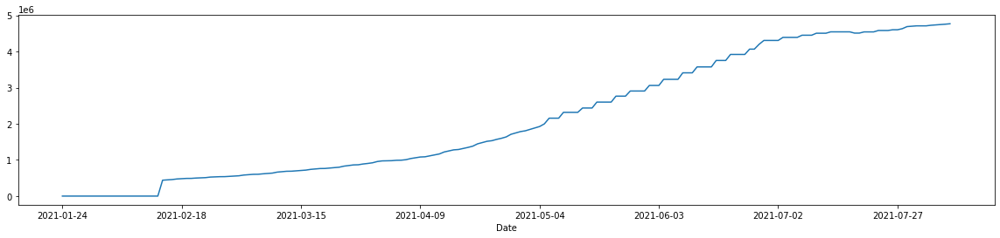

In [12]:
covid_vaccines_df['People_partially_vaccinated']['Switzerland'].plot(figsize=(20, 4))

In [13]:
covid_partially_vaccinated_df = covid_vaccines_df['People_partially_vaccinated'].unstack()
covid_fully_vaccinated_df = covid_vaccines_df['People_fully_vaccinated'].unstack()

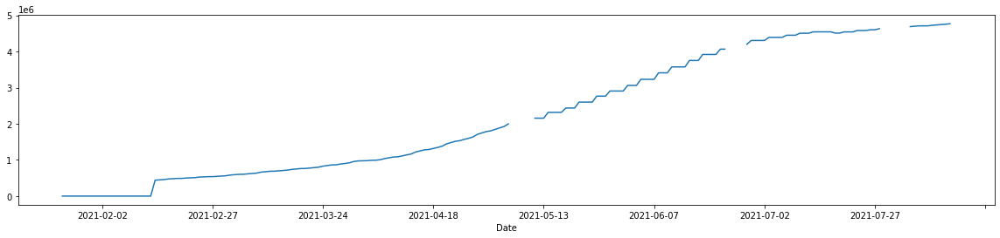

In [14]:
covid_partially_vaccinated_df.loc['Switzerland'].plot(figsize=(20, 4))

In [15]:
covid_partially_vaccinated_df.drop('US (Aggregate)', inplace=True)
covid_fully_vaccinated_df.drop('US (Aggregate)', inplace=True)

## Let's first delete wrong data according to google registers for partially vaccination dataframe.

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7ff82b972fd0>,
      dtype=object)

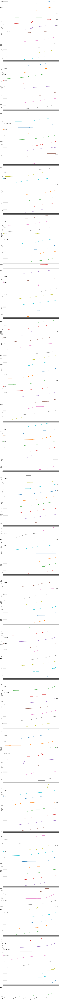

In [16]:
covid_partially_vaccinated_df.T.plot(figsize=(20, 400), subplots=True)

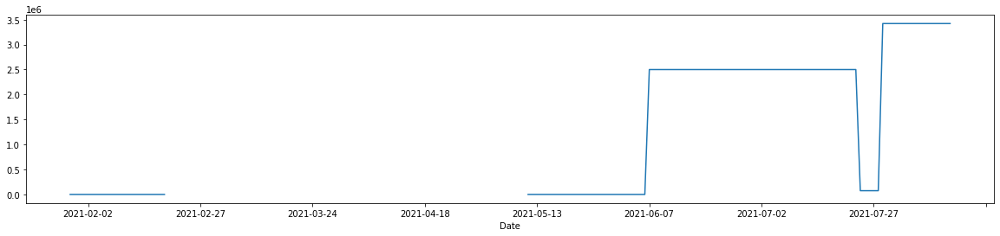

In [17]:
covid_partially_vaccinated_df.loc['Algeria'].T.plot(figsize=(20, 4))

In [18]:
covid_partially_vaccinated_df.loc['Algeria', '2021-07-22':'2021-07-30'] 

Date
2021-07-22    2500000.0
2021-07-23    2500000.0
2021-07-24      75000.0
2021-07-25      75000.0
2021-07-26      75000.0
2021-07-27      75000.0
2021-07-28      75000.0
2021-07-29    3421279.0
2021-07-30    3421279.0
Name: Algeria, dtype: float64

In [19]:
covid_partially_vaccinated_df.loc['Algeria', '2021-07-24':'2021-07-28'] = np.nan 

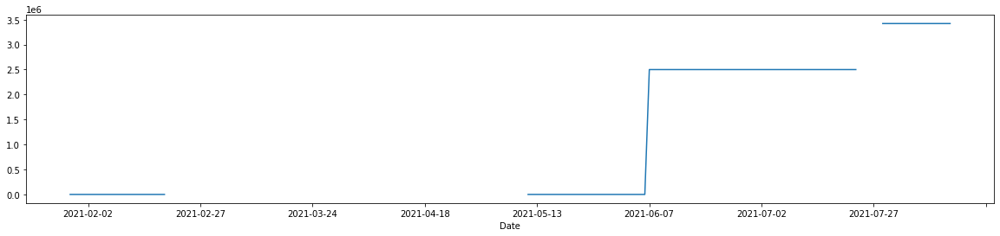

In [20]:
covid_partially_vaccinated_df.loc['Algeria'].T.plot(figsize=(20, 4))

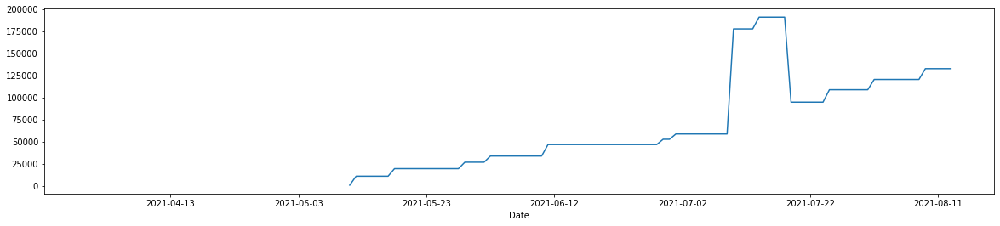

In [21]:
covid_partially_vaccinated_df.loc['Armenia'].T.plot(figsize=(20, 4))

In [22]:
covid_partially_vaccinated_df.loc['Armenia', '2021-07-08':'2021-07-20'] > 150000

Date
2021-07-08    False
2021-07-09    False
2021-07-10     True
2021-07-11     True
2021-07-12     True
2021-07-13     True
2021-07-14     True
2021-07-15     True
2021-07-16     True
2021-07-17     True
2021-07-18     True
2021-07-19    False
2021-07-20    False
Name: Armenia, dtype: bool

In [23]:
covid_partially_vaccinated_df.loc['Armenia', '2021-07-10':'2021-07-18'] = np.nan

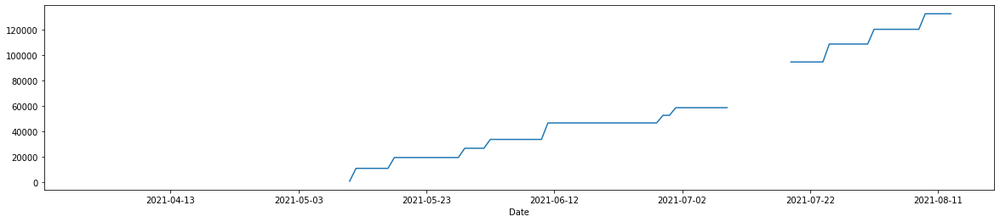

In [24]:
covid_partially_vaccinated_df.loc['Armenia'].T.plot(figsize=(20, 4))

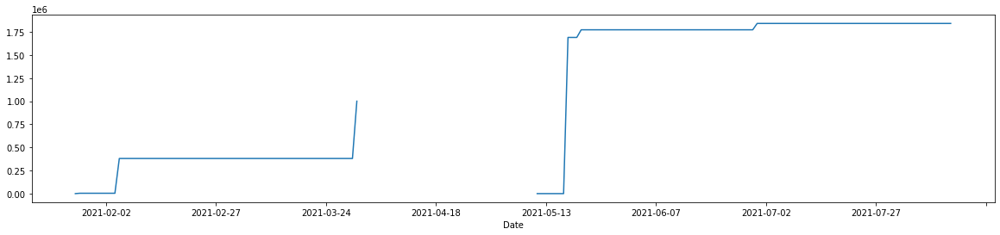

In [25]:
covid_partially_vaccinated_df.loc['Burma'].T.plot(figsize=(20, 4))

In [26]:
covid_partially_vaccinated_df.loc['Burma', '2021-05-09':'2021-05-18'] < 500000

Date
2021-05-09    False
2021-05-10    False
2021-05-11     True
2021-05-12     True
2021-05-13     True
2021-05-14     True
2021-05-15     True
2021-05-16     True
2021-05-17     True
2021-05-18    False
Name: Burma, dtype: bool

In [27]:
covid_partially_vaccinated_df.loc['Burma', '2021-05-11':'2021-05-17'] = np.nan

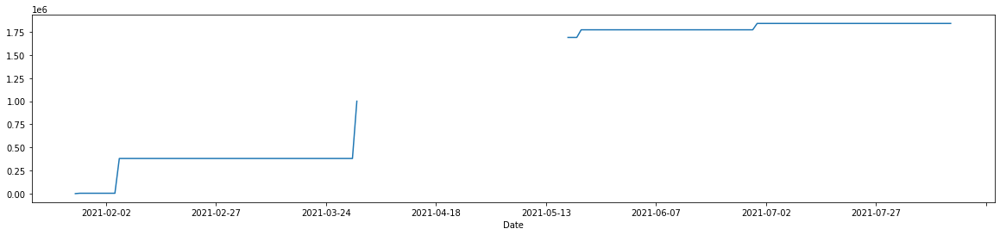

In [28]:
covid_partially_vaccinated_df.loc['Burma'].T.plot(figsize=(20, 4))

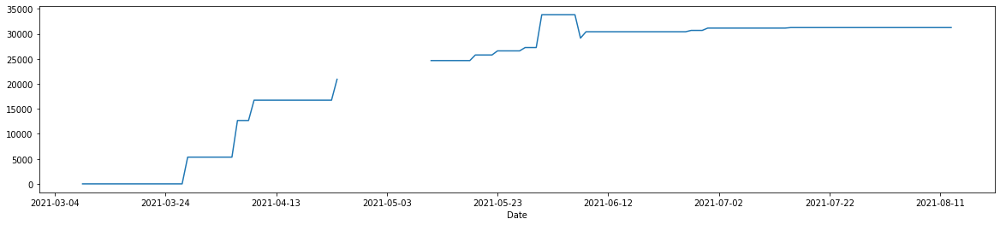

In [29]:
covid_partially_vaccinated_df.loc['Gambia'].T.plot(figsize=(20, 4))

In [30]:
covid_partially_vaccinated_df.loc['Gambia', '2021-05-29':'2021-06-09'] > 33000

Date
2021-05-29    False
2021-05-30    False
2021-05-31     True
2021-06-01     True
2021-06-02     True
2021-06-03     True
2021-06-04     True
2021-06-05     True
2021-06-06     True
2021-06-07    False
2021-06-08    False
2021-06-09    False
Name: Gambia, dtype: bool

In [31]:
covid_partially_vaccinated_df.loc['Gambia', '2021-05-31':'2021-06-06'] = np.nan

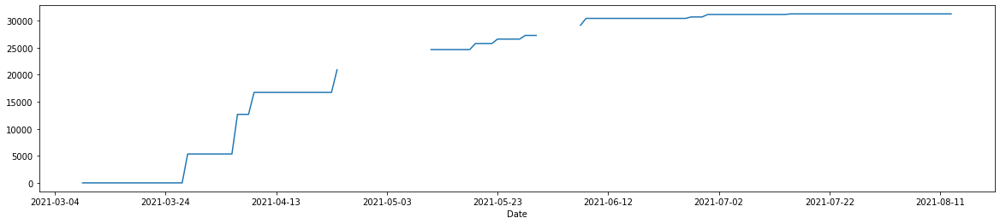

In [32]:
covid_partially_vaccinated_df.loc['Gambia'].T.plot(figsize=(20, 4))

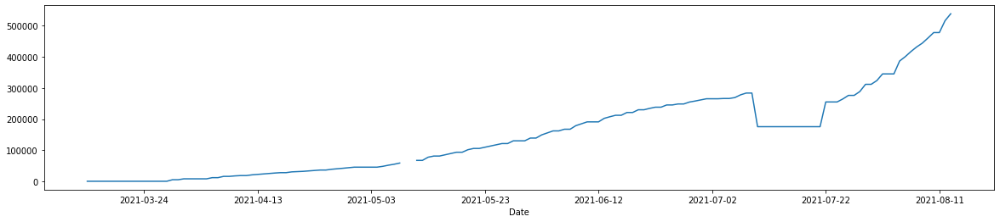

In [33]:
covid_partially_vaccinated_df.loc['Georgia'].T.plot(figsize=(20, 4))

In [34]:
covid_partially_vaccinated_df.loc['Georgia', '2021-07-08':'2021-07-23'] < 200000

Date
2021-07-08    False
2021-07-09    False
2021-07-10     True
2021-07-11     True
2021-07-12     True
2021-07-13     True
2021-07-14     True
2021-07-15     True
2021-07-16     True
2021-07-17     True
2021-07-18     True
2021-07-19     True
2021-07-20     True
2021-07-21     True
2021-07-22    False
2021-07-23    False
Name: Georgia, dtype: bool

In [35]:
covid_partially_vaccinated_df.loc['Georgia', '2021-07-10':'2021-07-21'] = np.nan

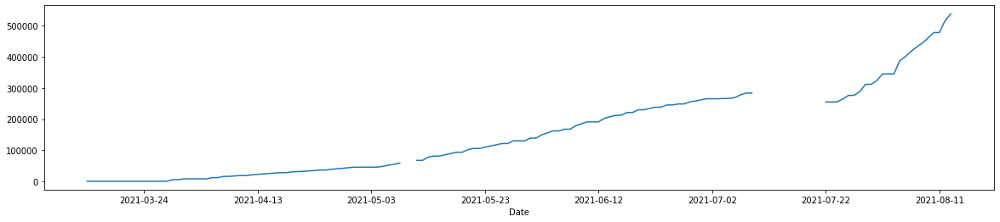

In [36]:
covid_partially_vaccinated_df.loc['Georgia'].T.plot(figsize=(20, 4))

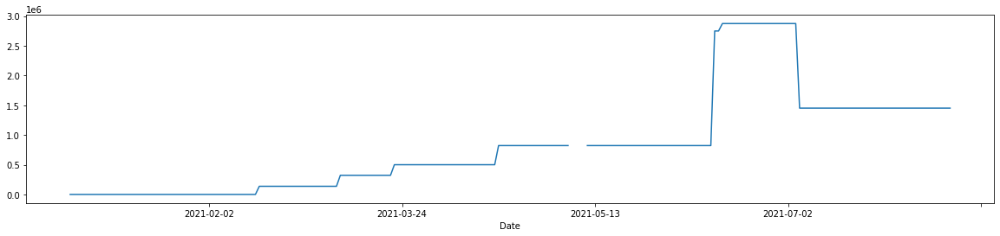

In [37]:
covid_partially_vaccinated_df.loc['Kuwait'].T.plot(figsize=(20, 4))

In [38]:
covid_partially_vaccinated_df.loc['Kuwait', '2021-06-11':'2021-07-07'] > 2500000

Date
2021-06-11    False
2021-06-12    False
2021-06-13     True
2021-06-14     True
2021-06-15     True
2021-06-16     True
2021-06-17     True
2021-06-18     True
2021-06-19     True
2021-06-20     True
2021-06-21     True
2021-06-22     True
2021-06-23     True
2021-06-24     True
2021-06-25     True
2021-06-26     True
2021-06-27     True
2021-06-28     True
2021-06-29     True
2021-06-30     True
2021-07-01     True
2021-07-02     True
2021-07-03     True
2021-07-04     True
2021-07-05    False
2021-07-06    False
2021-07-07    False
Name: Kuwait, dtype: bool

In [39]:
covid_partially_vaccinated_df.loc['Kuwait', '2021-06-13':'2021-07-04'] = np.nan

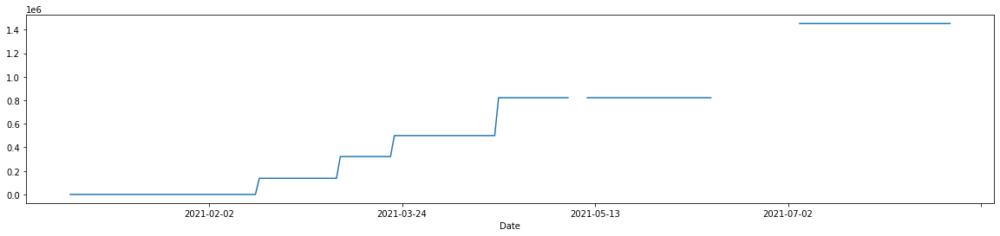

In [40]:
covid_partially_vaccinated_df.loc['Kuwait'].T.plot(figsize=(20, 4))

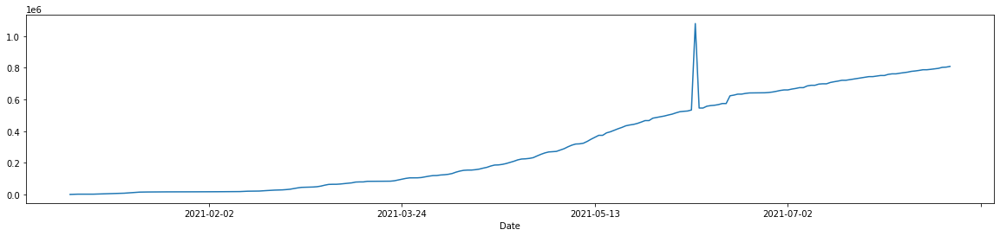

In [41]:
covid_partially_vaccinated_df.loc['Latvia'].T.plot(figsize=(20, 4))

In [42]:
covid_partially_vaccinated_df.loc['Latvia', '2021-06-04':'2021-06-12'] > 1000000

Date
2021-06-04    False
2021-06-05    False
2021-06-06    False
2021-06-07    False
2021-06-08     True
2021-06-09    False
2021-06-10    False
2021-06-11    False
2021-06-12    False
Name: Latvia, dtype: bool

In [43]:
covid_partially_vaccinated_df.loc['Latvia', '2021-06-08'] = np.nan

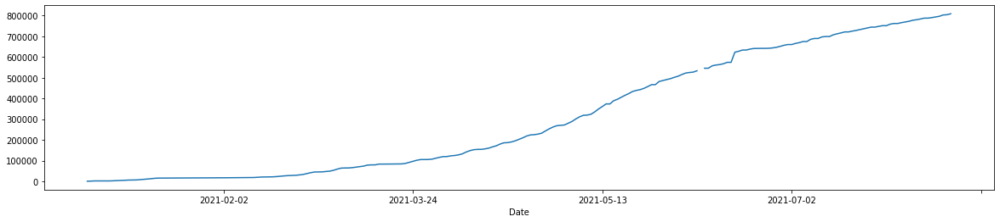

In [44]:
covid_partially_vaccinated_df.loc['Latvia'].T.plot(figsize=(20, 4))

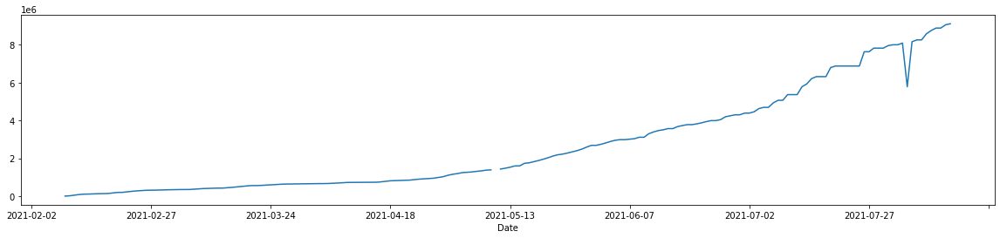

In [45]:
covid_partially_vaccinated_df.loc['Peru'].T.plot(figsize=(20, 4))

In [46]:
covid_partially_vaccinated_df.loc['Peru', '2021-07-30':'2021-08-07'] < 7000000

Date
2021-07-30    False
2021-07-31    False
2021-08-01    False
2021-08-02    False
2021-08-03    False
2021-08-04     True
2021-08-05    False
2021-08-06    False
2021-08-07    False
Name: Peru, dtype: bool

In [47]:
covid_partially_vaccinated_df.loc['Peru', '2021-08-04'] = np.nan

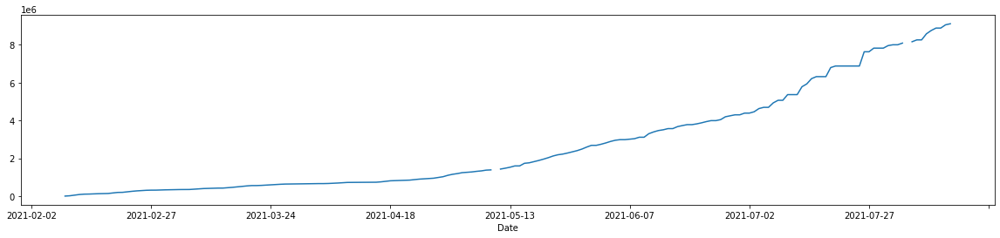

In [48]:
covid_partially_vaccinated_df.loc['Peru'].T.plot(figsize=(20, 4))

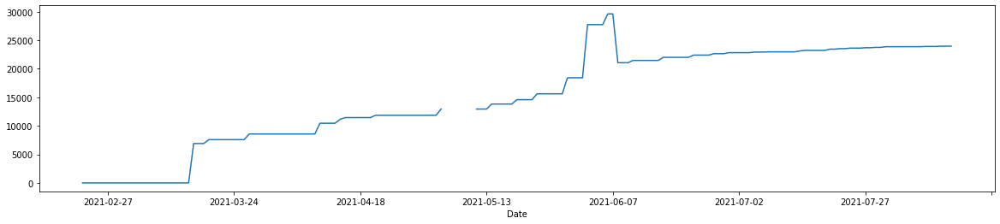

In [49]:
covid_partially_vaccinated_df.loc['Saint Kitts and Nevis'].T.plot(figsize=(20, 4))

In [50]:
covid_partially_vaccinated_df.loc['Saint Kitts and Nevis', '2021-05-30':'2021-06-10'] > 26000

Date
2021-05-30    False
2021-05-31    False
2021-06-01    False
2021-06-02     True
2021-06-03     True
2021-06-04     True
2021-06-05     True
2021-06-06     True
2021-06-07     True
2021-06-08    False
2021-06-09    False
2021-06-10    False
Name: Saint Kitts and Nevis, dtype: bool

In [51]:
covid_partially_vaccinated_df.loc['Saint Kitts and Nevis', '2021-06-02':'2021-06-07'] = np.nan

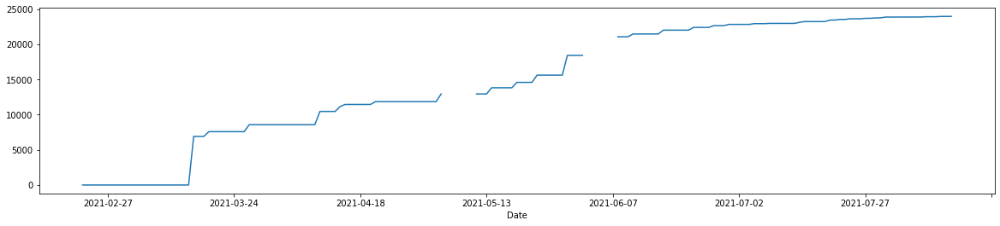

In [52]:
covid_partially_vaccinated_df.loc['Saint Kitts and Nevis'].T.plot(figsize=(20, 4))

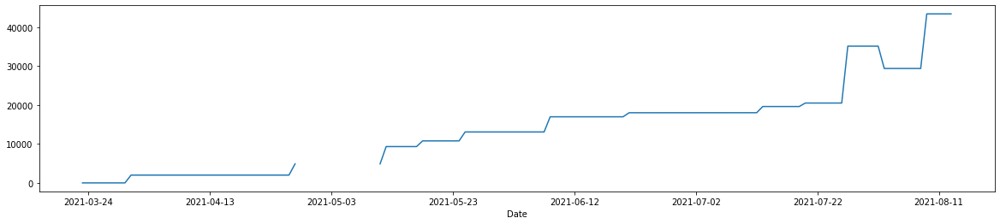

In [53]:
covid_partially_vaccinated_df.loc['Solomon Islands'].T.plot(figsize=(20, 4))

In [54]:
covid_partially_vaccinated_df.loc['Solomon Islands']['2021-07-22':'2021-08-06'] > 35000

Date
2021-07-22    False
2021-07-23    False
2021-07-24    False
2021-07-25    False
2021-07-26    False
2021-07-27     True
2021-07-28     True
2021-07-29     True
2021-07-30     True
2021-07-31     True
2021-08-01     True
2021-08-02    False
2021-08-03    False
2021-08-04    False
2021-08-05    False
2021-08-06    False
Name: Solomon Islands, dtype: bool

In [55]:
covid_partially_vaccinated_df.loc['Solomon Islands']['2021-07-27':'2021-08-01'] = np.nan

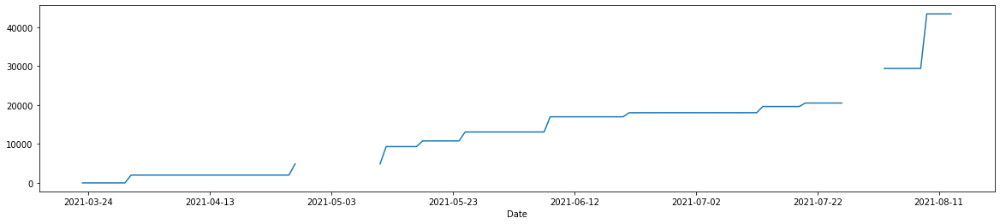

In [56]:
covid_partially_vaccinated_df.loc['Solomon Islands'].T.plot(figsize=(20, 4))

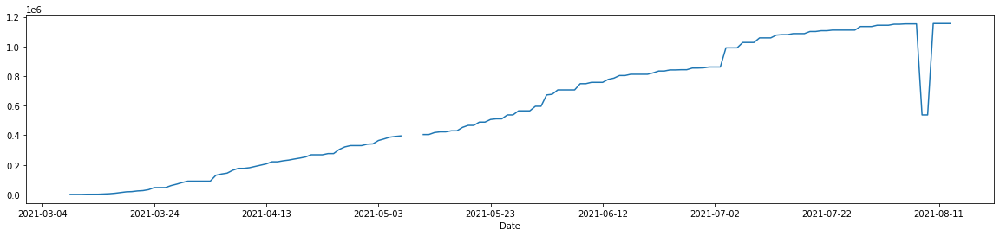

In [57]:
covid_partially_vaccinated_df.loc['Uganda'].T.plot(figsize=(20, 4))

In [58]:
covid_partially_vaccinated_df.loc['Uganda']['2021-08-01' : '2021-08-10'] < 1000000

Date
2021-08-01    False
2021-08-02    False
2021-08-03    False
2021-08-04    False
2021-08-05    False
2021-08-06    False
2021-08-07    False
2021-08-08     True
2021-08-09     True
2021-08-10    False
Name: Uganda, dtype: bool

In [59]:
covid_partially_vaccinated_df.loc['Uganda']['2021-08-08' : '2021-08-09'] = np.nan

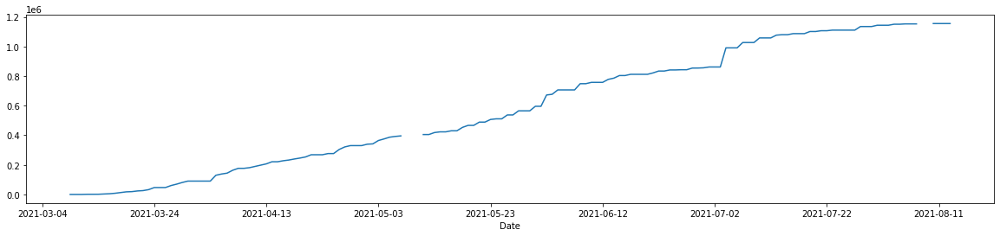

In [60]:
covid_partially_vaccinated_df.loc['Uganda'].T.plot(figsize=(20, 4))

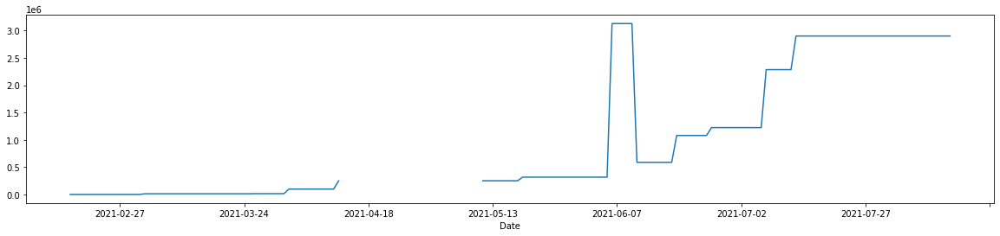

In [61]:
covid_partially_vaccinated_df.loc['Venezuela'].T.plot(figsize=(20, 4))

In [62]:
covid_partially_vaccinated_df.loc['Venezuela', covid_partially_vaccinated_df.loc['Venezuela'] > 3120000]

Date
2021-06-06    3127954.0
2021-06-07    3127954.0
2021-06-08    3127954.0
2021-06-09    3127954.0
2021-06-10    3127954.0
Name: Venezuela, dtype: float64

In [63]:
covid_partially_vaccinated_df.loc['Venezuela']['2021-06-06' : '2021-06-10'] = np.nan

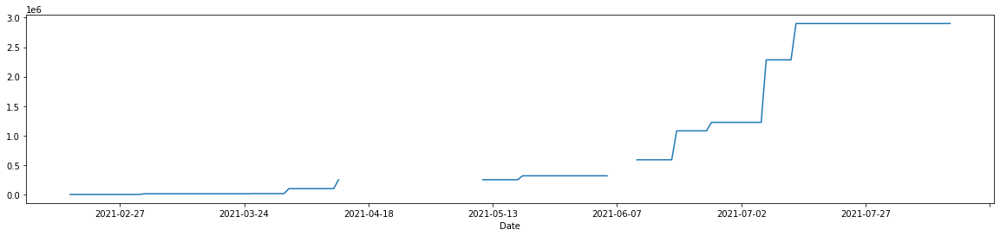

In [64]:
covid_partially_vaccinated_df.loc['Venezuela'].T.plot(figsize=(20, 4))

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7ff825547790>,
      dtype=object)

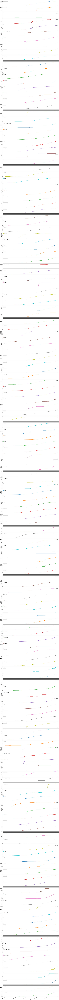

In [65]:
covid_partially_vaccinated_df.T.plot(figsize=(20, 400), subplots=True)

## Let's now delete wrong data according to google registers for fully vaccination dataframe.

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7ff82165d110>,
      dtype=object)

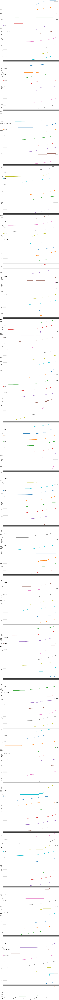

In [66]:
covid_fully_vaccinated_df.T.plot(figsize=(20, 400), subplots=True)

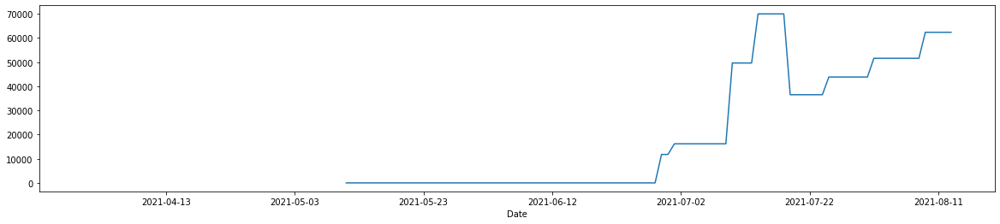

In [67]:
covid_fully_vaccinated_df.loc['Armenia'].T.plot(figsize=(20, 4))

In [68]:
covid_fully_vaccinated_df.loc['Armenia', '2021-07-07':'2021-07-22']

Date
2021-07-07    16196.0
2021-07-08    16196.0
2021-07-09    16196.0
2021-07-10    49654.0
2021-07-11    49654.0
2021-07-12    49654.0
2021-07-13    49654.0
2021-07-14    69998.0
2021-07-15    69998.0
2021-07-16    69998.0
2021-07-17    69998.0
2021-07-18    69998.0
2021-07-19    36520.0
2021-07-20    36520.0
2021-07-21    36520.0
2021-07-22    36520.0
Name: Armenia, dtype: float64

In [69]:
covid_fully_vaccinated_df.loc['Armenia', '2021-07-10':'2021-07-18'] = np.nan

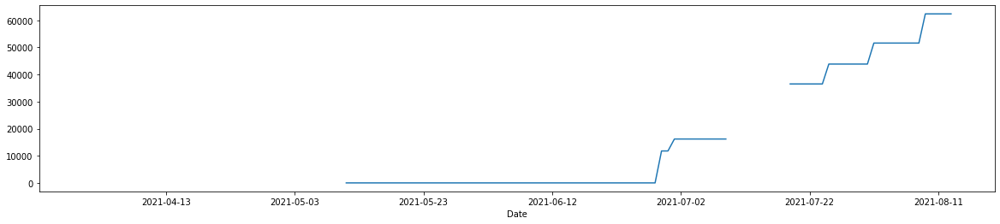

In [70]:
covid_fully_vaccinated_df.loc['Armenia'].T.plot(figsize=(20, 4))

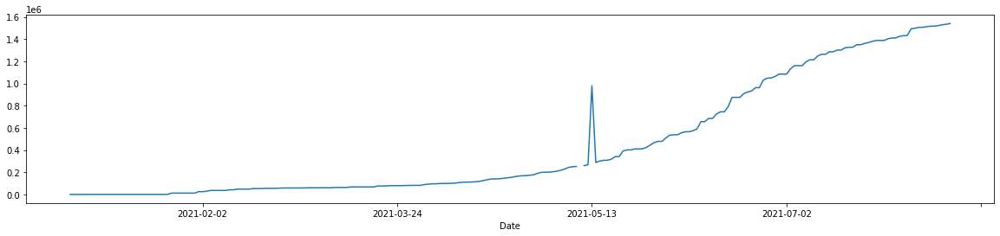

In [71]:
covid_fully_vaccinated_df.loc['Croatia'].T.plot(figsize=(20, 4))

In [72]:
covid_fully_vaccinated_df.loc['Croatia', '2021-05-10':'2021-05-14'] 

Date
2021-05-10         NaN
2021-05-11    259438.0
2021-05-12    267442.0
2021-05-13    980177.0
2021-05-14    288104.0
Name: Croatia, dtype: float64

In [73]:
covid_fully_vaccinated_df.loc['Croatia', '2021-05-13'] = np.nan

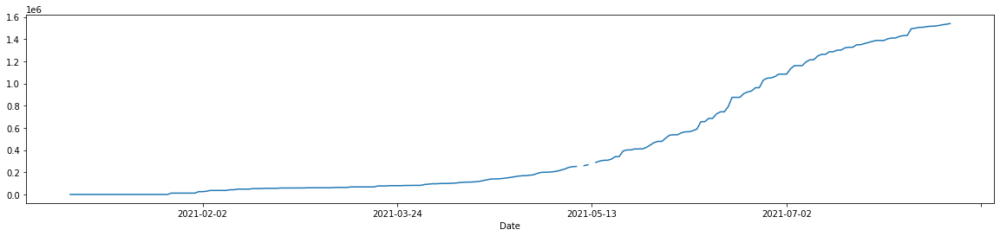

In [74]:
covid_fully_vaccinated_df.loc['Croatia'].T.plot(figsize=(20, 4))

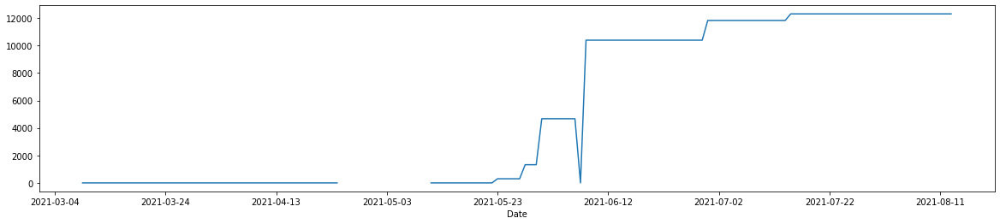

In [75]:
covid_fully_vaccinated_df.loc['Gambia'].T.plot(figsize=(20, 4))

In [76]:
covid_fully_vaccinated_df.loc['Gambia', '2021-06-05':'2021-06-08'] 

Date
2021-06-05     4671.0
2021-06-06     4671.0
2021-06-07        0.0
2021-06-08    10389.0
Name: Gambia, dtype: float64

In [77]:
covid_fully_vaccinated_df.loc['Gambia', '2021-06-07'] = np.nan

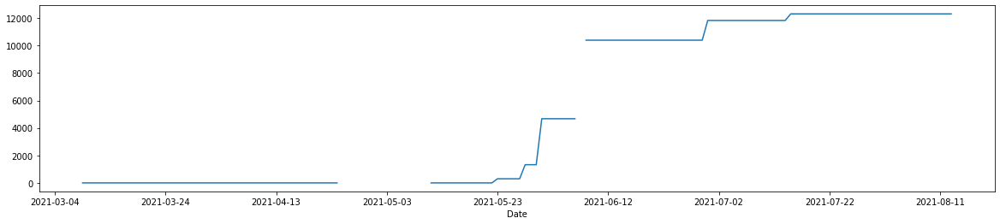

In [78]:
covid_fully_vaccinated_df.loc['Gambia'].T.plot(figsize=(20, 4))

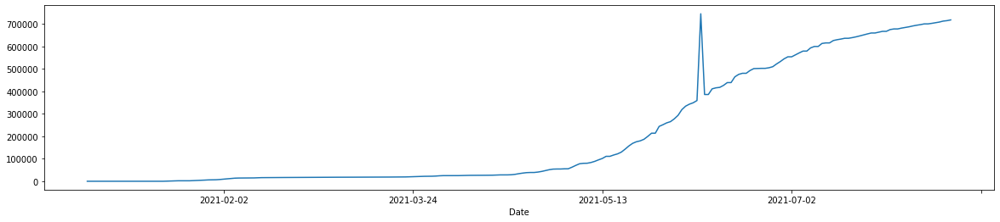

In [79]:
covid_fully_vaccinated_df.loc['Latvia'].T.plot(figsize=(20, 4))

In [80]:
covid_fully_vaccinated_df.loc['Latvia', '2021-06-05':'2021-06-10'] > 700000

Date
2021-06-05    False
2021-06-06    False
2021-06-07    False
2021-06-08     True
2021-06-09    False
2021-06-10    False
Name: Latvia, dtype: bool

In [81]:
covid_fully_vaccinated_df.loc['Latvia', '2021-06-08'] = np.nan

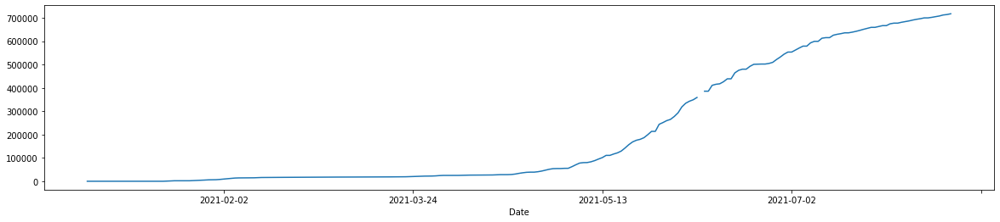

In [82]:
covid_fully_vaccinated_df.loc['Latvia'].T.plot(figsize=(20, 4))


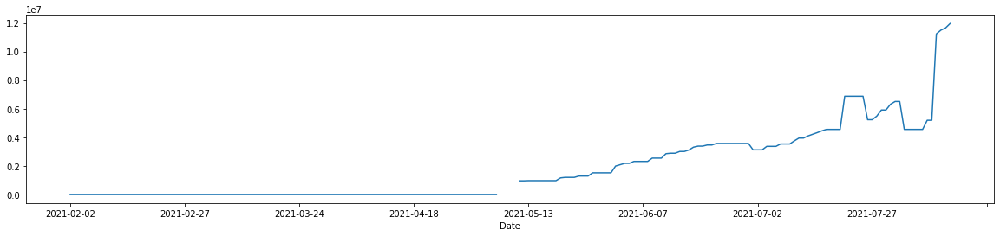

In [83]:
covid_fully_vaccinated_df.loc['Pakistan'].T.plot(figsize=(20, 4))

In [84]:
covid_fully_vaccinated_df.loc['Pakistan', '2021-07-20':]

Date
2021-07-20     4550696.0
2021-07-21     6869346.0
2021-07-22     6869346.0
2021-07-23     6869346.0
2021-07-24     6869346.0
2021-07-25     6869346.0
2021-07-26     5229222.0
2021-07-27     5229222.0
2021-07-28     5478872.0
2021-07-29     5907929.0
2021-07-30     5907929.0
2021-07-31     6312421.0
2021-08-01     6503987.0
2021-08-02     6503987.0
2021-08-03     4550696.0
2021-08-04     4550696.0
2021-08-05     4550696.0
2021-08-06     4550696.0
2021-08-07     4550696.0
2021-08-08     5188701.0
2021-08-09     5188701.0
2021-08-10    11229247.0
2021-08-11    11497462.0
2021-08-12    11646699.0
2021-08-13    11956552.0
Name: Pakistan, dtype: float64

In [85]:
covid_fully_vaccinated_df.loc['Pakistan', '2021-07-26':'2021-08-09'] = np.nan

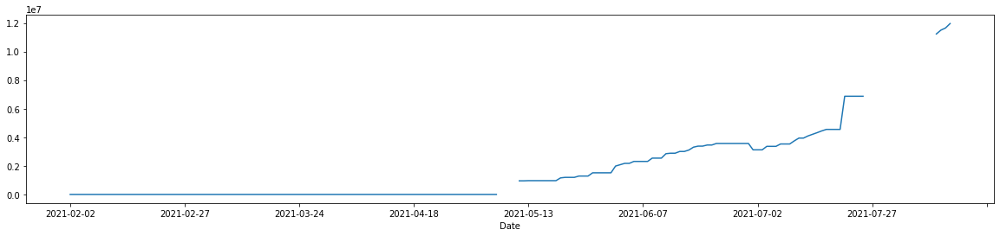

In [86]:
covid_fully_vaccinated_df.loc['Pakistan'].T.plot(figsize=(20, 4))

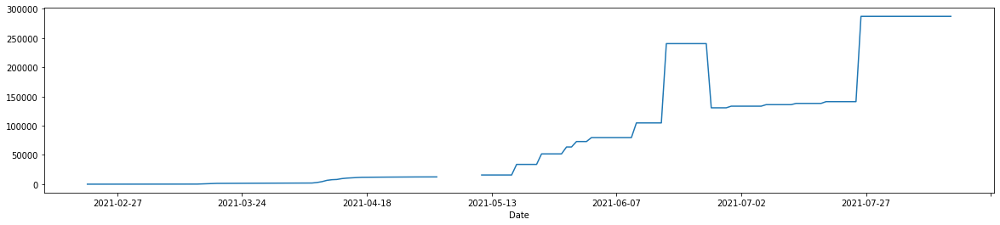

In [87]:
covid_fully_vaccinated_df.loc['Paraguay'].T.plot(figsize=(20, 4))

In [88]:
covid_fully_vaccinated_df.loc['Paraguay', '2021-06-15':'2021-06-27'] > 200000

Date
2021-06-15    False
2021-06-16    False
2021-06-17     True
2021-06-18     True
2021-06-19     True
2021-06-20     True
2021-06-21     True
2021-06-22     True
2021-06-23     True
2021-06-24     True
2021-06-25     True
2021-06-26    False
2021-06-27    False
Name: Paraguay, dtype: bool

In [89]:
covid_fully_vaccinated_df.loc['Paraguay', '2021-06-17':'2021-06-25'] = np.nan

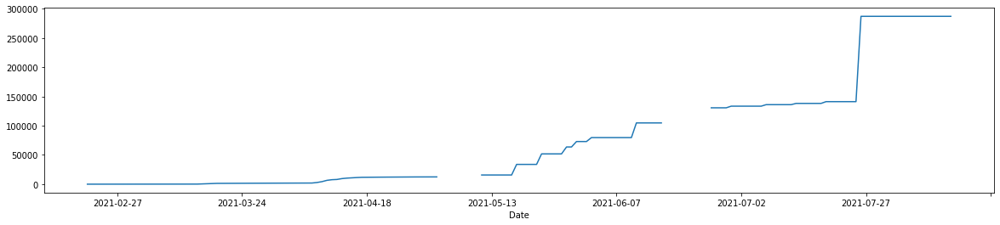

In [90]:
covid_fully_vaccinated_df.loc['Paraguay'].T.plot(figsize=(20, 4))

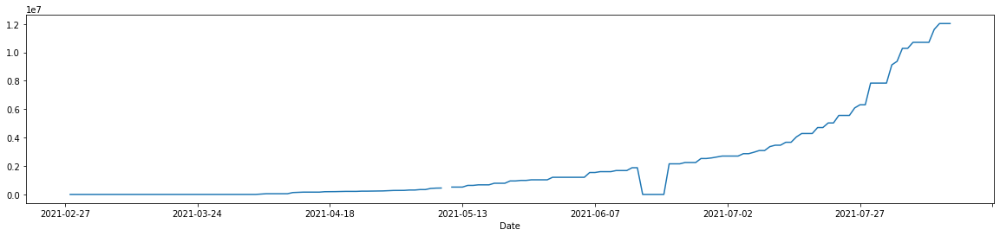

In [91]:
covid_fully_vaccinated_df.loc['Philippines'].T.plot(figsize=(20, 4))

In [92]:
covid_fully_vaccinated_df.loc['Philippines', '2021-06-15':'2021-06-21'] < 1000000

Date
2021-06-15    False
2021-06-16     True
2021-06-17     True
2021-06-18     True
2021-06-19     True
2021-06-20     True
2021-06-21    False
Name: Philippines, dtype: bool

In [93]:
covid_fully_vaccinated_df.loc['Philippines', '2021-06-16':'2021-06-20'] = np.nan

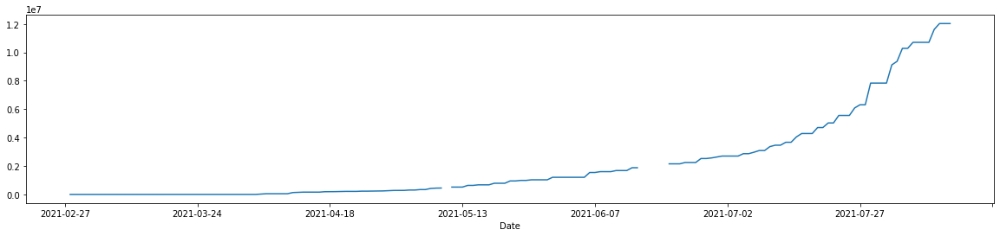

In [94]:
covid_fully_vaccinated_df.loc['Philippines'].T.plot(figsize=(20, 4))

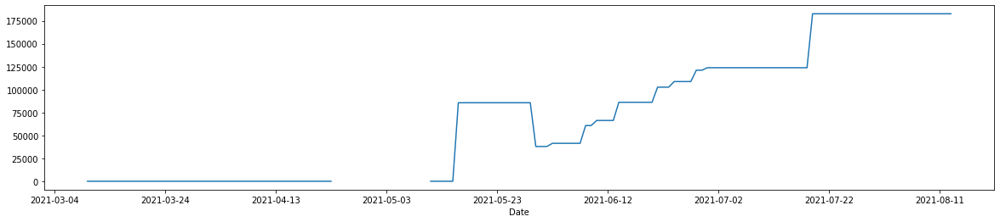

In [95]:
covid_fully_vaccinated_df.loc['Sudan'].T.plot(figsize=(20, 4))

In [96]:
covid_fully_vaccinated_df.loc['Sudan', '2021-05-14':'2021-05-31'] > 75000

Date
2021-05-14    False
2021-05-15    False
2021-05-16     True
2021-05-17     True
2021-05-18     True
2021-05-19     True
2021-05-20     True
2021-05-21     True
2021-05-22     True
2021-05-23     True
2021-05-24     True
2021-05-25     True
2021-05-26     True
2021-05-27     True
2021-05-28     True
2021-05-29     True
2021-05-30    False
2021-05-31    False
Name: Sudan, dtype: bool

In [97]:
covid_fully_vaccinated_df.loc['Sudan', '2021-05-16':'2021-05-29'] = np.nan

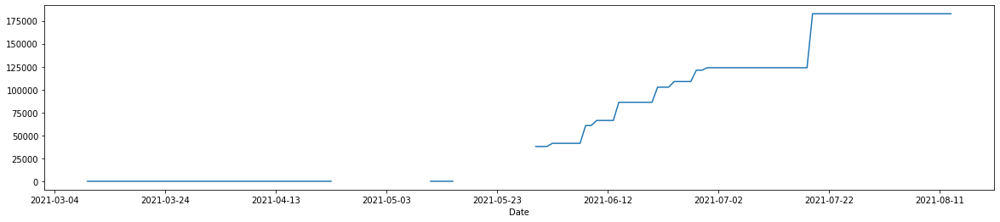

In [98]:
covid_fully_vaccinated_df.loc['Sudan'].T.plot(figsize=(20, 4))

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7ff81d069e10>,
      dtype=object)

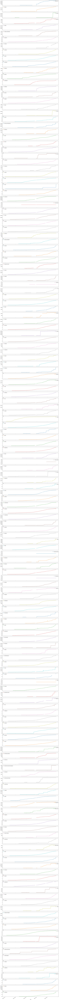

In [99]:
covid_fully_vaccinated_df.T.plot(figsize=(20, 400), subplots=True)

## Let's solves holes in data possibly caused for lack in reports some days or wrong data.

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7ff8191e7250>,
      dtype=object)

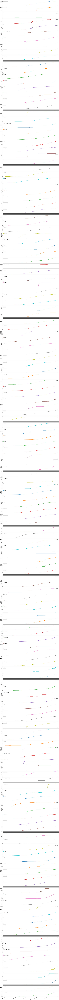

In [100]:
 covid_partially_vaccinated_df.T.plot(figsize=(20, 400), subplots=True)

In [101]:
covid_partially_vaccinated_df.ffill(axis=1, inplace=True)

# Replacing null fields from when vaccination had not started.
covid_partially_vaccinated_df[covid_partially_vaccinated_df.isna()] = 0

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7ff81670bdd0>,
      dtype=object)

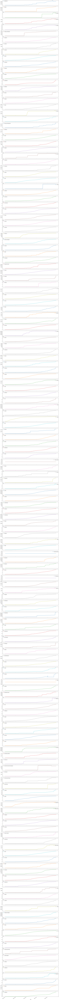

In [102]:
 covid_partially_vaccinated_df.T.plot(figsize=(20, 400), subplots=True)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7ff811e2d6d0>,
      dtype=object)

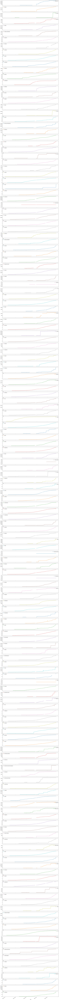

In [103]:
 covid_fully_vaccinated_df.T.plot(figsize=(20, 400), subplots=True)

In [104]:
covid_fully_vaccinated_df.ffill(axis=1, inplace=True)
# Replacing null fields from when vaccination had not started.
covid_fully_vaccinated_df[covid_fully_vaccinated_df.isna()] = 0

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7ff80dce3890>,
      dtype=object)

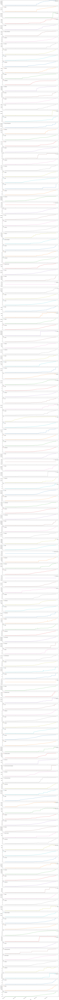

In [105]:
 covid_fully_vaccinated_df.T.plot(figsize=(20, 400), subplots=True)

In [106]:
covid_partially_vaccinated_df

Date,2020-12-14,2020-12-15,2020-12-16,2020-12-17,2020-12-18,2020-12-19,2020-12-20,2020-12-21,2020-12-22,2020-12-23,2020-12-24,2020-12-25,2020-12-26,2020-12-27,2020-12-28,2020-12-29,2020-12-30,2020-12-31,2021-01-01,2021-01-02,2021-01-03,2021-01-04,2021-01-05,2021-01-06,2021-01-07,2021-01-08,2021-01-09,2021-01-10,2021-01-11,2021-01-12,2021-01-13,2021-01-14,2021-01-15,2021-01-16,2021-01-17,2021-01-18,2021-01-19,2021-01-20,2021-01-21,2021-01-22,...,2021-07-05,2021-07-06,2021-07-07,2021-07-08,2021-07-09,2021-07-10,2021-07-11,2021-07-12,2021-07-13,2021-07-14,2021-07-15,2021-07-16,2021-07-17,2021-07-18,2021-07-19,2021-07-20,2021-07-21,2021-07-22,2021-07-23,2021-07-24,2021-07-25,2021-07-26,2021-07-27,2021-07-28,2021-07-29,2021-07-30,2021-07-31,2021-08-01,2021-08-02,2021-08-03,2021-08-04,2021-08-05,2021-08-06,2021-08-07,2021-08-08,2021-08-09,2021-08-10,2021-08-11,2021-08-12,2021-08-13
Country_Region,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Afghanistan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,726349.0,726349.0,735213.0,735213.0,735213.0,735213.0,735213.0,735213.0,742934.0,770229.0,770229.0,770229.0,770229.0,770229.0,811119.0,811119.0,811119.0,811119.0,811119.0,811119.0,861336.0,861336.0,861336.0,939835.0,763020.0,763020.0,763020.0,763020.0,763020.0,763936.0,763936.0,763936.0,763936.0,763936.0,763936.0,769869.0,769869.0,770302.0,770302.0,770302.0
Albania,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,128.0,188.0,266.0,308.0,369.0,405.0,447.0,483.0,519.0,549.0,549.0,...,574187.0,574187.0,579552.0,582106.0,582106.0,584832.0,587876.0,587876.0,592502.0,592502.0,596977.0,596977.0,596977.0,601701.0,602460.0,609538.0,616592.0,616592.0,624490.0,624490.0,624490.0,640047.0,640047.0,640047.0,640047.0,640047.0,665632.0,670215.0,672765.0,677938.0,683052.0,687768.0,693000.0,693000.0,693000.0,706470.0,706470.0,720232.0,720232.0,720232.0
Algeria,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2500000.0,2500000.0,2500000.0,2500000.0,2500000.0,2500000.0,2500000.0,2500000.0,2500000.0,2500000.0,2500000.0,2500000.0,2500000.0,2500000.0,2500000.0,2500000.0,2500000.0,2500000.0,2500000.0,2500000.0,2500000.0,2500000.0,2500000.0,2500000.0,3421279.0,3421279.0,3421279.0,3421279.0,3421279.0,3421279.0,3421279.0,3421279.0,3421279.0,3421279.0,3421279.0,3421279.0,3421279.0,3421279.0,3421279.0,3421279.0
Andorra,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,41716.0,41716.0,41716.0,41716.0,41716.0,41716.0,41716.0,41716.0,41716.0,41716.0,41716.0,41716.0,41716.0,43008.0,43008.0,43008.0,48445.0,48445.0,48445.0,48445.0,48445.0,48445.0,48445.0,48445.0,48445.0,48445.0,48445.0,48445.0,48445.0,48445.0,48445.0,48445.0,48445.0,48445.0,48445.0,48445.0,48445.0,48445.0,48445.0,48445.0
Angola,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,951772.0,951772.0,951772.0,951772.0,951772.0,951772.0,951772.0,951772.0,958373.0,958373.0,958373.0,958373.0,958373.0,958373.0,958373.0,958373.0,958373.0,958373.0,958373.0,958373.0,958373.0,958373.0,958373.0,958373.0,958373.0,958373.0,958373.0,958373.0,958373.0,969946.0,969946.0,969946.0,969946.0,969946.0,969946.0,972978.0,972978.0,972978.0,972978.0,972978.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Uz

In [107]:
covid_fully_vaccinated_df

Date,2020-12-14,2020-12-15,2020-12-16,2020-12-17,2020-12-18,2020-12-19,2020-12-20,2020-12-21,2020-12-22,2020-12-23,2020-12-24,2020-12-25,2020-12-26,2020-12-27,2020-12-28,2020-12-29,2020-12-30,2020-12-31,2021-01-01,2021-01-02,2021-01-03,2021-01-04,2021-01-05,2021-01-06,2021-01-07,2021-01-08,2021-01-09,2021-01-10,2021-01-11,2021-01-12,2021-01-13,2021-01-14,2021-01-15,2021-01-16,2021-01-17,2021-01-18,2021-01-19,2021-01-20,2021-01-21,2021-01-22,...,2021-07-05,2021-07-06,2021-07-07,2021-07-08,2021-07-09,2021-07-10,2021-07-11,2021-07-12,2021-07-13,2021-07-14,2021-07-15,2021-07-16,2021-07-17,2021-07-18,2021-07-19,2021-07-20,2021-07-21,2021-07-22,2021-07-23,2021-07-24,2021-07-25,2021-07-26,2021-07-27,2021-07-28,2021-07-29,2021-07-30,2021-07-31,2021-08-01,2021-08-02,2021-08-03,2021-08-04,2021-08-05,2021-08-06,2021-08-07,2021-08-08,2021-08-09,2021-08-10,2021-08-11,2021-08-12,2021-08-13
Country_Region,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Afghanistan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,189322.0,189322.0,199250.0,199250.0,199250.0,199250.0,199250.0,199250.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0
Albania,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,419894.0,419894.0,426111.0,429191.0,429191.0,431722.0,434926.0,434926.0,443165.0,443165.0,455131.0,455131.0,455131.0,465434.0,466905.0,472886.0,478861.0,478861.0,485295.0,485295.0,485295.0,498724.0,498724.0,498724.0,498724.0,498724.0,525215.0,528718.0,530322.0,534823.0,538588.0,541637.0,545036.0,545036.0,545036.0,553482.0,553482.0,560007.0,560007.0,560007.0
Algeria,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,724812.0,724812.0,724812.0,724812.0,724812.0,724812.0,724812.0,724812.0,724812.0,724812.0,724812.0,724812.0,724812.0,724812.0,724812.0,724812.0
Andorra,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,26613.0,26613.0,26613.0,26613.0,26613.0,26613.0,26613.0,26613.0,26613.0,26613.0,26613.0,26613.0,26613.0,27010.0,27010.0,27010.0,33904.0,33904.0,33904.0,33904.0,33904.0,33904.0,33904.0,33904.0,33904.0,33904.0,33904.0,33904.0,33904.0,33904.0,33904.0,33904.0,33904.0,33904.0,33904.0,33904.0,33904.0,33904.0,33904.0,33904.0
Angola,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,561688.0,561688.0,561688.0,561688.0,561688.0,561688.0,561688.0,561688.0,599828.0,599828.0,599828.0,599828.0,599828.0,599828.0,634164.0,634164.0,634164.0,634164.0,634164.0,634164.0,634164.0,634164.0,634164.0,634164.0,634164.0,634164.0,634164.0,634164.0,634164.0,710113.0,710113.0,710113.0,710113.0,710113.0,710113.0,722610.0,722610.0,722610.0,722610.0,722610.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Uzbekistan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1199541.0

## Let's standarize dates and fill lacking dates with zeroes.

In [108]:
countries = list(covid_partially_vaccinated_df.index)

In [109]:
dates_old_format_to_fill = ['2020-01-23', '2020-01-24', '2020-01-25', '2020-01-26', '2020-01-27', '2020-01-28', '2020-01-29', '2020-01-30', '2020-01-31', '2020-02-01', '2020-02-02', '2020-02-03', '2020-02-04', '2020-02-05', '2020-02-06', '2020-02-07', '2020-02-08', '2020-02-09', '2020-02-10', '2020-02-11', '2020-02-12', '2020-02-13', '2020-02-14', '2020-02-15', '2020-02-16', '2020-02-17', '2020-02-18', '2020-02-19', '2020-02-20', '2020-02-21', '2020-02-22', '2020-02-23', '2020-02-24', '2020-02-25', '2020-02-26', '2020-02-27', '2020-02-28', '2020-02-29', '2020-03-01', '2020-03-02', '2020-03-03', '2020-03-04', '2020-03-05', '2020-03-06', '2020-03-07', '2020-03-08', '2020-03-09', '2020-03-10', '2020-03-11', '2020-03-12', '2020-03-13', '2020-03-14', '2020-03-15', '2020-03-16', '2020-03-17', '2020-03-18', '2020-03-19', '2020-03-20', '2020-03-21', '2020-03-22', '2020-03-23', '2020-03-24', '2020-03-25', '2020-03-26', '2020-03-27', '2020-03-28', '2020-03-29', '2020-03-30', '2020-03-31', '2020-04-01', '2020-04-02', '2020-04-03', '2020-04-04', '2020-04-05', '2020-04-06', '2020-04-07', '2020-04-08', '2020-04-09', '2020-04-10', '2020-04-11', '2020-04-12', '2020-04-13', '2020-04-14', '2020-04-15', '2020-04-16', '2020-04-17', '2020-04-18', '2020-04-19', '2020-04-20', '2020-04-21', '2020-04-22', '2020-04-23', '2020-04-24', '2020-04-25', '2020-04-26', '2020-04-27', '2020-04-28', '2020-04-29', '2020-04-30', '2020-05-01', '2020-05-02', '2020-05-03', '2020-05-04', '2020-05-05', '2020-05-06', '2020-05-07', '2020-05-08', '2020-05-09', '2020-05-10', '2020-05-11', '2020-05-12', '2020-05-13', '2020-05-14', '2020-05-15', '2020-05-16', '2020-05-17', '2020-05-18', '2020-05-19', '2020-05-20', '2020-05-21', '2020-05-22', '2020-05-23', '2020-05-24', '2020-05-25', '2020-05-26', '2020-05-27', '2020-05-28', '2020-05-29', '2020-05-30', '2020-05-31', '2020-06-01', '2020-06-02', '2020-06-03', '2020-06-04', '2020-06-05', '2020-06-06', '2020-06-07', '2020-06-08', '2020-06-09', '2020-06-10', '2020-06-11', '2020-06-12', '2020-06-13', '2020-06-14', '2020-06-15', '2020-06-16', '2020-06-17', '2020-06-18', '2020-06-19', '2020-06-20', '2020-06-21', '2020-06-22', '2020-06-23', '2020-06-24', '2020-06-25', '2020-06-26', '2020-06-27', '2020-06-28', '2020-06-29', '2020-06-30', '2020-07-01', '2020-07-02', '2020-07-03', '2020-07-04', '2020-07-05', '2020-07-06', '2020-07-07', '2020-07-08', '2020-07-09', '2020-07-10', '2020-07-11', '2020-07-12', '2020-07-13', '2020-07-14', '2020-07-15', '2020-07-16', '2020-07-17', '2020-07-18', '2020-07-19', '2020-07-20', '2020-07-21', '2020-07-22', '2020-07-23', '2020-07-24', '2020-07-25', '2020-07-26', '2020-07-27', '2020-07-28', '2020-07-29', '2020-07-30', '2020-07-31', '2020-08-01', '2020-08-02', '2020-08-03', '2020-08-04', '2020-08-05', '2020-08-06', '2020-08-07', '2020-08-08', '2020-08-09', '2020-08-10', '2020-08-11', '2020-08-12', '2020-08-13', '2020-08-14', '2020-08-15', '2020-08-16', '2020-08-17', '2020-08-18', '2020-08-19', '2020-08-20', '2020-08-21', '2020-08-22', '2020-08-23', '2020-08-24', '2020-08-25', '2020-08-26', '2020-08-27', '2020-08-28', '2020-08-29', '2020-08-30', '2020-08-31', '2020-09-01', '2020-09-02', '2020-09-03', '2020-09-04', '2020-09-05', '2020-09-06', '2020-09-07', '2020-09-08', '2020-09-09', '2020-09-10', '2020-09-11', '2020-09-12', '2020-09-13', '2020-09-14', '2020-09-15', '2020-09-16', '2020-09-17', '2020-09-18', '2020-09-19', '2020-09-20', '2020-09-21', '2020-09-22', '2020-09-23', '2020-09-24', '2020-09-25', '2020-09-26', '2020-09-27', '2020-09-28', '2020-09-29', '2020-09-30', '2020-10-01', '2020-10-02', '2020-10-03', '2020-10-04', '2020-10-05', '2020-10-06', '2020-10-07', '2020-10-08', '2020-10-09', '2020-10-10', '2020-10-11', '2020-10-12', '2020-10-13', '2020-10-14', '2020-10-15', '2020-10-16', '2020-10-17', '2020-10-18', '2020-10-19', '2020-10-20', '2020-10-21', '2020-10-22', '2020-10-23', '2020-10-24', '2020-10-25', '2020-10-26', '2020-10-27', '2020-10-28', '2020-10-29', '2020-10-30', '2020-10-31', '2020-11-01', '2020-11-02', '2020-11-03', '2020-11-04', '2020-11-05', '2020-11-06', '2020-11-07', '2020-11-08', '2020-11-09', '2020-11-10', '2020-11-11', '2020-11-12', '2020-11-13', '2020-11-14', '2020-11-15', '2020-11-16', '2020-11-17', '2020-11-18', '2020-11-19', '2020-11-20', '2020-11-21', '2020-11-22', '2020-11-23', '2020-11-24', '2020-11-25', '2020-11-26', '2020-11-27', '2020-11-28', '2020-11-29', '2020-11-30', '2020-12-01', '2020-12-02', '2020-12-03', '2020-12-04', '2020-12-05', '2020-12-06', '2020-12-07', '2020-12-08', '2020-12-09', '2020-12-10', '2020-12-11', '2020-12-12', '2020-12-13']
dates_old_format = ['2020-01-23', '2020-01-24', '2020-01-25', '2020-01-26', '2020-01-27', '2020-01-28', '2020-01-29', '2020-01-30', '2020-01-31', '2020-02-01', '2020-02-02', '2020-02-03', '2020-02-04', '2020-02-05', '2020-02-06', '2020-02-07', '2020-02-08', '2020-02-09', '2020-02-10', '2020-02-11', '2020-02-12', '2020-02-13', '2020-02-14', '2020-02-15', '2020-02-16', '2020-02-17', '2020-02-18', '2020-02-19', '2020-02-20', '2020-02-21', '2020-02-22', '2020-02-23', '2020-02-24', '2020-02-25', '2020-02-26', '2020-02-27', '2020-02-28', '2020-02-29', '2020-03-01', '2020-03-02', '2020-03-03', '2020-03-04', '2020-03-05', '2020-03-06', '2020-03-07', '2020-03-08', '2020-03-09', '2020-03-10', '2020-03-11', '2020-03-12', '2020-03-13', '2020-03-14', '2020-03-15', '2020-03-16', '2020-03-17', '2020-03-18', '2020-03-19', '2020-03-20', '2020-03-21', '2020-03-22', '2020-03-23', '2020-03-24', '2020-03-25', '2020-03-26', '2020-03-27', '2020-03-28', '2020-03-29', '2020-03-30', '2020-03-31', '2020-04-01', '2020-04-02', '2020-04-03', '2020-04-04', '2020-04-05', '2020-04-06', '2020-04-07', '2020-04-08', '2020-04-09', '2020-04-10', '2020-04-11', '2020-04-12', '2020-04-13', '2020-04-14', '2020-04-15', '2020-04-16', '2020-04-17', '2020-04-18', '2020-04-19', '2020-04-20', '2020-04-21', '2020-04-22', '2020-04-23', '2020-04-24', '2020-04-25', '2020-04-26', '2020-04-27', '2020-04-28', '2020-04-29', '2020-04-30', '2020-05-01', '2020-05-02', '2020-05-03', '2020-05-04', '2020-05-05', '2020-05-06', '2020-05-07', '2020-05-08', '2020-05-09', '2020-05-10', '2020-05-11', '2020-05-12', '2020-05-13', '2020-05-14', '2020-05-15', '2020-05-16', '2020-05-17', '2020-05-18', '2020-05-19', '2020-05-20', '2020-05-21', '2020-05-22', '2020-05-23', '2020-05-24', '2020-05-25', '2020-05-26', '2020-05-27', '2020-05-28', '2020-05-29', '2020-05-30', '2020-05-31', '2020-06-01', '2020-06-02', '2020-06-03', '2020-06-04', '2020-06-05', '2020-06-06', '2020-06-07', '2020-06-08', '2020-06-09', '2020-06-10', '2020-06-11', '2020-06-12', '2020-06-13', '2020-06-14', '2020-06-15', '2020-06-16', '2020-06-17', '2020-06-18', '2020-06-19', '2020-06-20', '2020-06-21', '2020-06-22', '2020-06-23', '2020-06-24', '2020-06-25', '2020-06-26', '2020-06-27', '2020-06-28', '2020-06-29', '2020-06-30', '2020-07-01', '2020-07-02', '2020-07-03', '2020-07-04', '2020-07-05', '2020-07-06', '2020-07-07', '2020-07-08', '2020-07-09', '2020-07-10', '2020-07-11', '2020-07-12', '2020-07-13', '2020-07-14', '2020-07-15', '2020-07-16', '2020-07-17', '2020-07-18', '2020-07-19', '2020-07-20', '2020-07-21', '2020-07-22', '2020-07-23', '2020-07-24', '2020-07-25', '2020-07-26', '2020-07-27', '2020-07-28', '2020-07-29', '2020-07-30', '2020-07-31', '2020-08-01', '2020-08-02', '2020-08-03', '2020-08-04', '2020-08-05', '2020-08-06', '2020-08-07', '2020-08-08', '2020-08-09', '2020-08-10', '2020-08-11', '2020-08-12', '2020-08-13', '2020-08-14', '2020-08-15', '2020-08-16', '2020-08-17', '2020-08-18', '2020-08-19', '2020-08-20', '2020-08-21', '2020-08-22', '2020-08-23', '2020-08-24', '2020-08-25', '2020-08-26', '2020-08-27', '2020-08-28', '2020-08-29', '2020-08-30', '2020-08-31', '2020-09-01', '2020-09-02', '2020-09-03', '2020-09-04', '2020-09-05', '2020-09-06', '2020-09-07', '2020-09-08', '2020-09-09', '2020-09-10', '2020-09-11', '2020-09-12', '2020-09-13', '2020-09-14', '2020-09-15', '2020-09-16', '2020-09-17', '2020-09-18', '2020-09-19', '2020-09-20', '2020-09-21', '2020-09-22', '2020-09-23', '2020-09-24', '2020-09-25', '2020-09-26', '2020-09-27', '2020-09-28', '2020-09-29', '2020-09-30', '2020-10-01', '2020-10-02', '2020-10-03', '2020-10-04', '2020-10-05', '2020-10-06', '2020-10-07', '2020-10-08', '2020-10-09', '2020-10-10', '2020-10-11', '2020-10-12', '2020-10-13', '2020-10-14', '2020-10-15', '2020-10-16', '2020-10-17', '2020-10-18', '2020-10-19', '2020-10-20', '2020-10-21', '2020-10-22', '2020-10-23', '2020-10-24', '2020-10-25', '2020-10-26', '2020-10-27', '2020-10-28', '2020-10-29', '2020-10-30', '2020-10-31', '2020-11-01', '2020-11-02', '2020-11-03', '2020-11-04', '2020-11-05', '2020-11-06', '2020-11-07', '2020-11-08', '2020-11-09', '2020-11-10', '2020-11-11', '2020-11-12', '2020-11-13', '2020-11-14', '2020-11-15', '2020-11-16', '2020-11-17', '2020-11-18', '2020-11-19', '2020-11-20', '2020-11-21', '2020-11-22', '2020-11-23', '2020-11-24', '2020-11-25', '2020-11-26', '2020-11-27', '2020-11-28', '2020-11-29', '2020-11-30', '2020-12-01', '2020-12-02', '2020-12-03', '2020-12-04', '2020-12-05', '2020-12-06', '2020-12-07', '2020-12-08', '2020-12-09', '2020-12-10', '2020-12-11', '2020-12-12', '2020-12-13', '2020-12-14', '2020-12-15', '2020-12-16', '2020-12-17', '2020-12-18', '2020-12-19', '2020-12-20', '2020-12-21', '2020-12-22', '2020-12-23', '2020-12-24', '2020-12-25', '2020-12-26', '2020-12-27', '2020-12-28', '2020-12-29', '2020-12-30', '2020-12-31', '2021-01-01', '2021-01-02', '2021-01-03', '2021-01-04', '2021-01-05', '2021-01-06', '2021-01-07', '2021-01-08', '2021-01-09', '2021-01-10', '2021-01-11', '2021-01-12', '2021-01-13', '2021-01-14', '2021-01-15', '2021-01-16', '2021-01-17', '2021-01-18', '2021-01-19', '2021-01-20', '2021-01-21', '2021-01-22', '2021-01-23', '2021-01-24', '2021-01-25', '2021-01-26', '2021-01-27', '2021-01-28', '2021-01-29', '2021-01-30', '2021-01-31', '2021-02-01', '2021-02-02', '2021-02-03', '2021-02-04', '2021-02-05', '2021-02-06', '2021-02-07', '2021-02-08', '2021-02-09', '2021-02-10', '2021-02-11', '2021-02-12', '2021-02-13', '2021-02-14', '2021-02-15', '2021-02-16', '2021-02-17', '2021-02-18', '2021-02-19', '2021-02-20', '2021-02-21', '2021-02-22', '2021-02-23', '2021-02-24', '2021-02-25', '2021-02-26', '2021-02-27', '2021-02-28', '2021-03-01', '2021-03-02', '2021-03-03', '2021-03-04', '2021-03-05', '2021-03-06', '2021-03-07', '2021-03-08', '2021-03-09', '2021-03-10', '2021-03-11', '2021-03-12', '2021-03-13', '2021-03-14', '2021-03-15', '2021-03-16', '2021-03-17', '2021-03-18', '2021-03-19', '2021-03-20', '2021-03-21', '2021-03-22', '2021-03-23', '2021-03-24', '2021-03-25', '2021-03-26', '2021-03-27', '2021-03-28', '2021-03-29', '2021-03-30', '2021-03-31', '2021-04-01', '2021-04-02', '2021-04-03', '2021-04-04', '2021-04-05', '2021-04-06', '2021-04-07', '2021-04-08', '2021-04-09', '2021-04-10', '2021-04-11', '2021-04-12', '2021-04-13', '2021-04-14', '2021-04-15', '2021-04-16', '2021-04-17', '2021-04-18', '2021-04-19', '2021-04-20', '2021-04-21', '2021-04-22', '2021-04-23', '2021-04-24', '2021-04-25', '2021-04-26', '2021-04-27', '2021-04-28', '2021-04-29', '2021-04-30', '2021-05-01', '2021-05-02', '2021-05-03', '2021-05-04', '2021-05-05', '2021-05-06', '2021-05-07', '2021-05-08', '2021-05-09', '2021-05-10', '2021-05-11', '2021-05-12', '2021-05-13', '2021-05-14', '2021-05-15', '2021-05-16', '2021-05-17', '2021-05-18', '2021-05-19', '2021-05-20', '2021-05-21', '2021-05-22', '2021-05-23', '2021-05-24', '2021-05-25', '2021-05-26', '2021-05-27', '2021-05-28', '2021-05-29', '2021-05-30', '2021-05-31', '2021-06-01', '2021-06-02', '2021-06-03', '2021-06-04', '2021-06-05', '2021-06-06', '2021-06-07', '2021-06-08', '2021-06-09', '2021-06-10', '2021-06-11', '2021-06-12', '2021-06-13', '2021-06-14', '2021-06-15', '2021-06-16', '2021-06-17', '2021-06-18', '2021-06-19', '2021-06-20', '2021-06-21', '2021-06-22', '2021-06-23', '2021-06-24', '2021-06-25', '2021-06-26', '2021-06-27', '2021-06-28', '2021-06-29', '2021-06-30', '2021-07-01', '2021-07-02', '2021-07-03', '2021-07-04', '2021-07-05', '2021-07-06', '2021-07-07', '2021-07-08', '2021-07-09', '2021-07-10', '2021-07-11', '2021-07-12', '2021-07-13', '2021-07-14', '2021-07-15', '2021-07-16', '2021-07-17', '2021-07-18', '2021-07-19', '2021-07-20', '2021-07-21', '2021-07-22', '2021-07-23', '2021-07-24', '2021-07-25', '2021-07-26', '2021-07-27', '2021-07-28', '2021-07-29', '2021-07-30', '2021-07-31', '2021-08-01', '2021-08-02', '2021-08-03', '2021-08-04', '2021-08-05', '2021-08-06', '2021-08-07', '2021-08-08', '2021-08-09', '2021-08-10', '2021-08-11', '2021-08-12', '2021-08-13']
dates_new_format = ['1/23/20',  '1/24/20',  '1/25/20',  '1/26/20',  '1/27/20',  '1/28/20',  '1/29/20',  '1/30/20',  '1/31/20',  '2/1/20',  '2/2/20',  '2/3/20',  '2/4/20',  '2/5/20',  '2/6/20',  '2/7/20',  '2/8/20',  '2/9/20',  '2/10/20',  '2/11/20',  '2/12/20',  '2/13/20',  '2/14/20',  '2/15/20',  '2/16/20',  '2/17/20',  '2/18/20',  '2/19/20',  '2/20/20',  '2/21/20',  '2/22/20',  '2/23/20',  '2/24/20',  '2/25/20',  '2/26/20',  '2/27/20',  '2/28/20',  '2/29/20',  '3/1/20',  '3/2/20',  '3/3/20',  '3/4/20',  '3/5/20',  '3/6/20',  '3/7/20',  '3/8/20',  '3/9/20',  '3/10/20',  '3/11/20',  '3/12/20',  '3/13/20',  '3/14/20',  '3/15/20',  '3/16/20',  '3/17/20',  '3/18/20',  '3/19/20',  '3/20/20',  '3/21/20',  '3/22/20',  '3/23/20',  '3/24/20',  '3/25/20',  '3/26/20',  '3/27/20',  '3/28/20',  '3/29/20',  '3/30/20',  '3/31/20',  '4/1/20',  '4/2/20',  '4/3/20',  '4/4/20',  '4/5/20',  '4/6/20',  '4/7/20',  '4/8/20',  '4/9/20',  '4/10/20',  '4/11/20',  '4/12/20',  '4/13/20',  '4/14/20',  '4/15/20',  '4/16/20',  '4/17/20',  '4/18/20',  '4/19/20',  '4/20/20',  '4/21/20',  '4/22/20',  '4/23/20',  '4/24/20',  '4/25/20',  '4/26/20',  '4/27/20',  '4/28/20',  '4/29/20',  '4/30/20',  '5/1/20',  '5/2/20',  '5/3/20',  '5/4/20',  '5/5/20',  '5/6/20',  '5/7/20',  '5/8/20',  '5/9/20',  '5/10/20',  '5/11/20',  '5/12/20',  '5/13/20',  '5/14/20',  '5/15/20',  '5/16/20',  '5/17/20',  '5/18/20',  '5/19/20',  '5/20/20',  '5/21/20',  '5/22/20',  '5/23/20',  '5/24/20',  '5/25/20',  '5/26/20',  '5/27/20',  '5/28/20',  '5/29/20',  '5/30/20',  '5/31/20',  '6/1/20',  '6/2/20',  '6/3/20',  '6/4/20',  '6/5/20',  '6/6/20',  '6/7/20',  '6/8/20',  '6/9/20',  '6/10/20',  '6/11/20',  '6/12/20',  '6/13/20',  '6/14/20',  '6/15/20',  '6/16/20',  '6/17/20',  '6/18/20',  '6/19/20',  '6/20/20',  '6/21/20',  '6/22/20',  '6/23/20',  '6/24/20',  '6/25/20',  '6/26/20',  '6/27/20',  '6/28/20',  '6/29/20',  '6/30/20',  '7/1/20',  '7/2/20',  '7/3/20',  '7/4/20',  '7/5/20',  '7/6/20',  '7/7/20',  '7/8/20',  '7/9/20',  '7/10/20',  '7/11/20',  '7/12/20',  '7/13/20',  '7/14/20',  '7/15/20',  '7/16/20',  '7/17/20',  '7/18/20',  '7/19/20',  '7/20/20',  '7/21/20',  '7/22/20',  '7/23/20',  '7/24/20',  '7/25/20',  '7/26/20',  '7/27/20',  '7/28/20',  '7/29/20',  '7/30/20',  '7/31/20',  '8/1/20',  '8/2/20',  '8/3/20',  '8/4/20',  '8/5/20',  '8/6/20',  '8/7/20',  '8/8/20',  '8/9/20',  '8/10/20',  '8/11/20',  '8/12/20',  '8/13/20',  '8/14/20',  '8/15/20',  '8/16/20',  '8/17/20',  '8/18/20',  '8/19/20',  '8/20/20',  '8/21/20',  '8/22/20',  '8/23/20',  '8/24/20',  '8/25/20',  '8/26/20',  '8/27/20',  '8/28/20',  '8/29/20',  '8/30/20',  '8/31/20',  '9/1/20',  '9/2/20',  '9/3/20',  '9/4/20',  '9/5/20',  '9/6/20',  '9/7/20',  '9/8/20',  '9/9/20',  '9/10/20',  '9/11/20',  '9/12/20',  '9/13/20',  '9/14/20',  '9/15/20',  '9/16/20',  '9/17/20',  '9/18/20',  '9/19/20',  '9/20/20',  '9/21/20',  '9/22/20',  '9/23/20',  '9/24/20',  '9/25/20',  '9/26/20',  '9/27/20',  '9/28/20',  '9/29/20',  '9/30/20',  '10/1/20',  '10/2/20',  '10/3/20',  '10/4/20',  '10/5/20',  '10/6/20',  '10/7/20',  '10/8/20',  '10/9/20',  '10/10/20',  '10/11/20',  '10/12/20',  '10/13/20',  '10/14/20',  '10/15/20',  '10/16/20',  '10/17/20',  '10/18/20',  '10/19/20',  '10/20/20',  '10/21/20',  '10/22/20',  '10/23/20',  '10/24/20',  '10/25/20',  '10/26/20',  '10/27/20',  '10/28/20',  '10/29/20',  '10/30/20',  '10/31/20',  '11/1/20',  '11/2/20',  '11/3/20',  '11/4/20',  '11/5/20',  '11/6/20',  '11/7/20',  '11/8/20',  '11/9/20',  '11/10/20',  '11/11/20',  '11/12/20',  '11/13/20',  '11/14/20',  '11/15/20',  '11/16/20',  '11/17/20',  '11/18/20',  '11/19/20',  '11/20/20',  '11/21/20',  '11/22/20',  '11/23/20',  '11/24/20',  '11/25/20',  '11/26/20',  '11/27/20',  '11/28/20',  '11/29/20',  '11/30/20',  '12/1/20',  '12/2/20',  '12/3/20',  '12/4/20',  '12/5/20',  '12/6/20',  '12/7/20',  '12/8/20',  '12/9/20',  '12/10/20',  '12/11/20',  '12/12/20',  '12/13/20',  '12/14/20',  '12/15/20',  '12/16/20',  '12/17/20',  '12/18/20',  '12/19/20',  '12/20/20',  '12/21/20',  '12/22/20',  '12/23/20',  '12/24/20',  '12/25/20',  '12/26/20',  '12/27/20',  '12/28/20',  '12/29/20',  '12/30/20',  '12/31/20',  '1/1/21',  '1/2/21',  '1/3/21',  '1/4/21',  '1/5/21',  '1/6/21',  '1/7/21',  '1/8/21',  '1/9/21',  '1/10/21',  '1/11/21',  '1/12/21',  '1/13/21',  '1/14/21',  '1/15/21',  '1/16/21',  '1/17/21',  '1/18/21',  '1/19/21',  '1/20/21',  '1/21/21',  '1/22/21',  '1/23/21',  '1/24/21',  '1/25/21',  '1/26/21',  '1/27/21',  '1/28/21',  '1/29/21',  '1/30/21',  '1/31/21',  '2/1/21',  '2/2/21',  '2/3/21',  '2/4/21',  '2/5/21',  '2/6/21',  '2/7/21',  '2/8/21',  '2/9/21',  '2/10/21',  '2/11/21',  '2/12/21',  '2/13/21',  '2/14/21',  '2/15/21',  '2/16/21',  '2/17/21',  '2/18/21',  '2/19/21',  '2/20/21',  '2/21/21',  '2/22/21',  '2/23/21',  '2/24/21',  '2/25/21',  '2/26/21',  '2/27/21',  '2/28/21',  '3/1/21',  '3/2/21',  '3/3/21',  '3/4/21',  '3/5/21',  '3/6/21',  '3/7/21',  '3/8/21',  '3/9/21',  '3/10/21',  '3/11/21',  '3/12/21',  '3/13/21',  '3/14/21',  '3/15/21',  '3/16/21',  '3/17/21',  '3/18/21',  '3/19/21',  '3/20/21',  '3/21/21',  '3/22/21',  '3/23/21',  '3/24/21',  '3/25/21',  '3/26/21',  '3/27/21',  '3/28/21',  '3/29/21',  '3/30/21',  '3/31/21',  '4/1/21',  '4/2/21',  '4/3/21',  '4/4/21',  '4/5/21',  '4/6/21',  '4/7/21',  '4/8/21',  '4/9/21',  '4/10/21',  '4/11/21',  '4/12/21',  '4/13/21',  '4/14/21',  '4/15/21',  '4/16/21',  '4/17/21',  '4/18/21',  '4/19/21',  '4/20/21',  '4/21/21',  '4/22/21',  '4/23/21',  '4/24/21',  '4/25/21',  '4/26/21',  '4/27/21',  '4/28/21',  '4/29/21',  '4/30/21',  '5/1/21',  '5/2/21',  '5/3/21',  '5/4/21',  '5/5/21',  '5/6/21',  '5/7/21',  '5/8/21',  '5/9/21',  '5/10/21',  '5/11/21',  '5/12/21',  '5/13/21',  '5/14/21',  '5/15/21',  '5/16/21',  '5/17/21',  '5/18/21',  '5/19/21',  '5/20/21',  '5/21/21',  '5/22/21',  '5/23/21',  '5/24/21',  '5/25/21',  '5/26/21',  '5/27/21',  '5/28/21',  '5/29/21',  '5/30/21',  '5/31/21',  '6/1/21',  '6/2/21',  '6/3/21',  '6/4/21',  '6/5/21',  '6/6/21',  '6/7/21',  '6/8/21',  '6/9/21',  '6/10/21',  '6/11/21',  '6/12/21',  '6/13/21',  '6/14/21',  '6/15/21',  '6/16/21',  '6/17/21',  '6/18/21',  '6/19/21',  '6/20/21',  '6/21/21',  '6/22/21',  '6/23/21',  '6/24/21',  '6/25/21',  '6/26/21',  '6/27/21',  '6/28/21',  '6/29/21',  '6/30/21',  '7/1/21',  '7/2/21',  '7/3/21',  '7/4/21',  '7/5/21',  '7/6/21',  '7/7/21',  '7/8/21',  '7/9/21',  '7/10/21',  '7/11/21',  '7/12/21',  '7/13/21',  '7/14/21',  '7/15/21',  '7/16/21',  '7/17/21',  '7/18/21',  '7/19/21',  '7/20/21',  '7/21/21',  '7/22/21',  '7/23/21',  '7/24/21',  '7/25/21',  '7/26/21',  '7/27/21',  '7/28/21',  '7/29/21',  '7/30/21',  '7/31/21',  '8/1/21',  '8/2/21',  '8/3/21',  '8/4/21',  '8/5/21',  '8/6/21',  '8/7/21',  '8/8/21',  '8/9/21',  '8/10/21',  '8/11/21',  '8/12/21',  '8/13/21']
rename_dict = dict(zip(dates_old_format, dates_new_format))
rename_dict['Country_Region	'] = 'Country/Region'

In [110]:
zeroes_fully_vaccinated_df = pd.DataFrame(0, index=countries, columns=dates_old_format_to_fill)
zeroes_partially_vaccinated_df = pd.DataFrame(0, index=countries, columns=dates_old_format_to_fill)

In [111]:
covid_fully_vaccinated_df = pd.concat([zeroes_fully_vaccinated_df, covid_fully_vaccinated_df], axis=1)
covid_partially_vaccinated_df = pd.concat([zeroes_partially_vaccinated_df, covid_partially_vaccinated_df], axis=1)

In [112]:
covid_fully_vaccinated_df

,2020-01-23,2020-01-24,2020-01-25,2020-01-26,2020-01-27,2020-01-28,2020-01-29,2020-01-30,2020-01-31,2020-02-01,2020-02-02,2020-02-03,2020-02-04,2020-02-05,2020-02-06,2020-02-07,2020-02-08,2020-02-09,2020-02-10,2020-02-11,2020-02-12,2020-02-13,2020-02-14,2020-02-15,2020-02-16,2020-02-17,2020-02-18,2020-02-19,2020-02-20,2020-02-21,2020-02-22,2020-02-23,2020-02-24,2020-02-25,2020-02-26,2020-02-27,2020-02-28,2020-02-29,2020-03-01,2020-03-02,...,2021-07-05,2021-07-06,2021-07-07,2021-07-08,2021-07-09,2021-07-10,2021-07-11,2021-07-12,2021-07-13,2021-07-14,2021-07-15,2021-07-16,2021-07-17,2021-07-18,2021-07-19,2021-07-20,2021-07-21,2021-07-22,2021-07-23,2021-07-24,2021-07-25,2021-07-26,2021-07-27,2021-07-28,2021-07-29,2021-07-30,2021-07-31,2021-08-01,2021-08-02,2021-08-03,2021-08-04,2021-08-05,2021-08-06,2021-08-07,2021-08-08,2021-08-09,2021-08-10,2021-08-11,2021-08-12,2021-08-13
Country_Region,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Afghanistan,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,189322.0,189322.0,199250.0,199250.0,199250.0,199250.0,199250.0,199250.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0
Albania,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,419894.0,419894.0,426111.0,429191.0,429191.0,431722.0,434926.0,434926.0,443165.0,443165.0,455131.0,455131.0,455131.0,465434.0,466905.0,472886.0,478861.0,478861.0,485295.0,485295.0,485295.0,498724.0,498724.0,498724.0,498724.0,498724.0,525215.0,528718.0,530322.0,534823.0,538588.0,541637.0,545036.0,545036.0,545036.0,553482.0,553482.0,560007.0,560007.0,560007.0
Algeria,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,724812.0,724812.0,724812.0,724812.0,724812.0,724812.0,724812.0,724812.0,724812.0,724812.0,724812.0,724812.0,724812.0,724812.0,724812.0,724812.0
Andorra,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,26613.0,26613.0,26613.0,26613.0,26613.0,26613.0,26613.0,26613.0,26613.0,26613.0,26613.0,26613.0,26613.0,27010.0,27010.0,27010.0,33904.0,33904.0,33904.0,33904.0,33904.0,33904.0,33904.0,33904.0,33904.0,33904.0,33904.0,33904.0,33904.0,33904.0,33904.0,33904.0,33904.0,33904.0,33904.0,33904.0,33904.0,33904.0,33904.0,33904.0
Angola,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,561688.0,561688.0,561688.0,561688.0,561688.0,561688.0,561688.0,561688.0,599828.0,599828.0,599828.0,599828.0,599828.0,599828.0,634164.0,634164.0,634164.0,634164.0,634164.0,634164.0,634164.0,634164.0,634164.0,634164.0,634164.0,634164.0,634164.0,634164.0,634164.0,710113.0,710113.0,710113.0,710113.0,710113.0,710113.0,722610.0,722610.0,722610.0,722610.0,722610.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Uzbekistan,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,1199541.0,1199541.0,1199541.0,1199541.0,1199541.0,1199541.0,1199541.0,1199541.0,1199541.0,1199541.0,1199541.0,1199541.0,1199541.0,1199541.0,1199541.0,1023425.0,1023425.0,1023425.0,1023425.0,1023425.0,1023425.0,1023425.0,1023425.0,1023425.0,1023425.0,1023425.0,1023425.0,1023425.0,1023425.0,1023425.0,1232807.0,1232807.0,1232807.0,1232807.0,1257000.0,1257000.0,1257000.0,1257000.0,1257000.0,1257000.0
Venezuela,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...

In [113]:
covid_partially_vaccinated_df

,2020-01-23,2020-01-24,2020-01-25,2020-01-26,2020-01-27,2020-01-28,2020-01-29,2020-01-30,2020-01-31,2020-02-01,2020-02-02,2020-02-03,2020-02-04,2020-02-05,2020-02-06,2020-02-07,2020-02-08,2020-02-09,2020-02-10,2020-02-11,2020-02-12,2020-02-13,2020-02-14,2020-02-15,2020-02-16,2020-02-17,2020-02-18,2020-02-19,2020-02-20,2020-02-21,2020-02-22,2020-02-23,2020-02-24,2020-02-25,2020-02-26,2020-02-27,2020-02-28,2020-02-29,2020-03-01,2020-03-02,...,2021-07-05,2021-07-06,2021-07-07,2021-07-08,2021-07-09,2021-07-10,2021-07-11,2021-07-12,2021-07-13,2021-07-14,2021-07-15,2021-07-16,2021-07-17,2021-07-18,2021-07-19,2021-07-20,2021-07-21,2021-07-22,2021-07-23,2021-07-24,2021-07-25,2021-07-26,2021-07-27,2021-07-28,2021-07-29,2021-07-30,2021-07-31,2021-08-01,2021-08-02,2021-08-03,2021-08-04,2021-08-05,2021-08-06,2021-08-07,2021-08-08,2021-08-09,2021-08-10,2021-08-11,2021-08-12,2021-08-13
Country_Region,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Afghanistan,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,726349.0,726349.0,735213.0,735213.0,735213.0,735213.0,735213.0,735213.0,742934.0,770229.0,770229.0,770229.0,770229.0,770229.0,811119.0,811119.0,811119.0,811119.0,811119.0,811119.0,861336.0,861336.0,861336.0,939835.0,763020.0,763020.0,763020.0,763020.0,763020.0,763936.0,763936.0,763936.0,763936.0,763936.0,763936.0,769869.0,769869.0,770302.0,770302.0,770302.0
Albania,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,574187.0,574187.0,579552.0,582106.0,582106.0,584832.0,587876.0,587876.0,592502.0,592502.0,596977.0,596977.0,596977.0,601701.0,602460.0,609538.0,616592.0,616592.0,624490.0,624490.0,624490.0,640047.0,640047.0,640047.0,640047.0,640047.0,665632.0,670215.0,672765.0,677938.0,683052.0,687768.0,693000.0,693000.0,693000.0,706470.0,706470.0,720232.0,720232.0,720232.0
Algeria,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,2500000.0,2500000.0,2500000.0,2500000.0,2500000.0,2500000.0,2500000.0,2500000.0,2500000.0,2500000.0,2500000.0,2500000.0,2500000.0,2500000.0,2500000.0,2500000.0,2500000.0,2500000.0,2500000.0,2500000.0,2500000.0,2500000.0,2500000.0,2500000.0,3421279.0,3421279.0,3421279.0,3421279.0,3421279.0,3421279.0,3421279.0,3421279.0,3421279.0,3421279.0,3421279.0,3421279.0,3421279.0,3421279.0,3421279.0,3421279.0
Andorra,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,41716.0,41716.0,41716.0,41716.0,41716.0,41716.0,41716.0,41716.0,41716.0,41716.0,41716.0,41716.0,41716.0,43008.0,43008.0,43008.0,48445.0,48445.0,48445.0,48445.0,48445.0,48445.0,48445.0,48445.0,48445.0,48445.0,48445.0,48445.0,48445.0,48445.0,48445.0,48445.0,48445.0,48445.0,48445.0,48445.0,48445.0,48445.0,48445.0,48445.0
Angola,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,951772.0,951772.0,951772.0,951772.0,951772.0,951772.0,951772.0,951772.0,958373.0,958373.0,958373.0,958373.0,958373.0,958373.0,958373.0,958373.0,958373.0,958373.0,958373.0,958373.0,958373.0,958373.0,958373.0,958373.0,958373.0,958373.0,958373.0,958373.0,958373.0,969946.0,969946.0,969946.0,969946.0,969946.0,969946.0,972978.0,972978.0,972978.0,972978.0,972978.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Uzbekistan,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,2074701.0,2074701.0,2074701.0,2074701.0,2074701.0,2074701.0,2074701.0,2074701.0,2074701.0,2074701.0,2074701.0,2074701.0,2074701.0,2074701.0,2074701.0,3667979.0,3667979.0,3667979.0,3667979.0,3667979.0,3667979.0,3667979.0,3667979.0,3667979.0,3667979.0,3667979.0,3667979.0,3667979.0,3667979.0,3667979.0,5231451.0,5231451.0,5231451.0,523

In [114]:
# Let's rename the columns.
covid_fully_vaccinated_df.rename(columns=rename_dict, inplace=True)
covid_partially_vaccinated_df.rename(columns=rename_dict,inplace=True)

In [115]:
# Let's change index name.
covid_fully_vaccinated_df.index.rename('Country/Region', inplace=True)
covid_partially_vaccinated_df.index.rename('Country/Region', inplace=True)

In [116]:
covid_fully_vaccinated_df

,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,2/1/20,2/2/20,2/3/20,2/4/20,2/5/20,2/6/20,2/7/20,2/8/20,2/9/20,2/10/20,2/11/20,2/12/20,2/13/20,2/14/20,2/15/20,2/16/20,2/17/20,2/18/20,2/19/20,2/20/20,2/21/20,2/22/20,2/23/20,2/24/20,2/25/20,2/26/20,2/27/20,2/28/20,2/29/20,3/1/20,3/2/20,...,7/5/21,7/6/21,7/7/21,7/8/21,7/9/21,7/10/21,7/11/21,7/12/21,7/13/21,7/14/21,7/15/21,7/16/21,7/17/21,7/18/21,7/19/21,7/20/21,7/21/21,7/22/21,7/23/21,7/24/21,7/25/21,7/26/21,7/27/21,7/28/21,7/29/21,7/30/21,7/31/21,8/1/21,8/2/21,8/3/21,8/4/21,8/5/21,8/6/21,8/7/21,8/8/21,8/9/21,8/10/21,8/11/21,8/12/21,8/13/21
Country/Region,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Afghanistan,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,189322.0,189322.0,199250.0,199250.0,199250.0,199250.0,199250.0,199250.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0,219159.0
Albania,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,419894.0,419894.0,426111.0,429191.0,429191.0,431722.0,434926.0,434926.0,443165.0,443165.0,455131.0,455131.0,455131.0,465434.0,466905.0,472886.0,478861.0,478861.0,485295.0,485295.0,485295.0,498724.0,498724.0,498724.0,498724.0,498724.0,525215.0,528718.0,530322.0,534823.0,538588.0,541637.0,545036.0,545036.0,545036.0,553482.0,553482.0,560007.0,560007.0,560007.0
Algeria,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,724812.0,724812.0,724812.0,724812.0,724812.0,724812.0,724812.0,724812.0,724812.0,724812.0,724812.0,724812.0,724812.0,724812.0,724812.0,724812.0
Andorra,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,26613.0,26613.0,26613.0,26613.0,26613.0,26613.0,26613.0,26613.0,26613.0,26613.0,26613.0,26613.0,26613.0,27010.0,27010.0,27010.0,33904.0,33904.0,33904.0,33904.0,33904.0,33904.0,33904.0,33904.0,33904.0,33904.0,33904.0,33904.0,33904.0,33904.0,33904.0,33904.0,33904.0,33904.0,33904.0,33904.0,33904.0,33904.0,33904.0,33904.0
Angola,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,561688.0,561688.0,561688.0,561688.0,561688.0,561688.0,561688.0,561688.0,599828.0,599828.0,599828.0,599828.0,599828.0,599828.0,634164.0,634164.0,634164.0,634164.0,634164.0,634164.0,634164.0,634164.0,634164.0,634164.0,634164.0,634164.0,634164.0,634164.0,634164.0,710113.0,710113.0,710113.0,710113.0,710113.0,710113.0,722610.0,722610.0,722610.0,722610.0,722610.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Uzbekistan,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,1199541.0,1199541.0,1199541.0,1199541.0,1199541.0,1199541.0,1199541.0,1199541.0,1199541.0,1199541.0,1199541.0,1199541.0,1199541.0,1199541.0,1199541.0,1023425.0,1023425.0,1023425.0,1023425.0,1023425.0,1023425.0,1023425.0,1023425.0,1023425.0,1023425.0,1023425.0,1023425.0,1023425.0,1023425.0,1023425.0,1232807.0,1232807.0,1232807.0,1232807.0,1257000.0,1257000.0,1257000.0,1257000.0,1257000.0,1257000.0
Venezuela,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,223858.0,223858.0,223858.0,223858.0,223858.0,223858.0,223858.0,223858.0,1100000.0,1100000.0,1100000.0,1100000.0,1100000.0,1100000.0,1100000.0,1100000.0,1100000.0,1100000.0,1100000.0,1100000.0,1100000.0,1100000.0,1100000.0,1100000.0,1100000.0,1100000.0,1100000.0,11

In [117]:
covid_partially_vaccinated_df

,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,2/1/20,2/2/20,2/3/20,2/4/20,2/5/20,2/6/20,2/7/20,2/8/20,2/9/20,2/10/20,2/11/20,2/12/20,2/13/20,2/14/20,2/15/20,2/16/20,2/17/20,2/18/20,2/19/20,2/20/20,2/21/20,2/22/20,2/23/20,2/24/20,2/25/20,2/26/20,2/27/20,2/28/20,2/29/20,3/1/20,3/2/20,...,7/5/21,7/6/21,7/7/21,7/8/21,7/9/21,7/10/21,7/11/21,7/12/21,7/13/21,7/14/21,7/15/21,7/16/21,7/17/21,7/18/21,7/19/21,7/20/21,7/21/21,7/22/21,7/23/21,7/24/21,7/25/21,7/26/21,7/27/21,7/28/21,7/29/21,7/30/21,7/31/21,8/1/21,8/2/21,8/3/21,8/4/21,8/5/21,8/6/21,8/7/21,8/8/21,8/9/21,8/10/21,8/11/21,8/12/21,8/13/21
Country/Region,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Afghanistan,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,726349.0,726349.0,735213.0,735213.0,735213.0,735213.0,735213.0,735213.0,742934.0,770229.0,770229.0,770229.0,770229.0,770229.0,811119.0,811119.0,811119.0,811119.0,811119.0,811119.0,861336.0,861336.0,861336.0,939835.0,763020.0,763020.0,763020.0,763020.0,763020.0,763936.0,763936.0,763936.0,763936.0,763936.0,763936.0,769869.0,769869.0,770302.0,770302.0,770302.0
Albania,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,574187.0,574187.0,579552.0,582106.0,582106.0,584832.0,587876.0,587876.0,592502.0,592502.0,596977.0,596977.0,596977.0,601701.0,602460.0,609538.0,616592.0,616592.0,624490.0,624490.0,624490.0,640047.0,640047.0,640047.0,640047.0,640047.0,665632.0,670215.0,672765.0,677938.0,683052.0,687768.0,693000.0,693000.0,693000.0,706470.0,706470.0,720232.0,720232.0,720232.0
Algeria,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,2500000.0,2500000.0,2500000.0,2500000.0,2500000.0,2500000.0,2500000.0,2500000.0,2500000.0,2500000.0,2500000.0,2500000.0,2500000.0,2500000.0,2500000.0,2500000.0,2500000.0,2500000.0,2500000.0,2500000.0,2500000.0,2500000.0,2500000.0,2500000.0,3421279.0,3421279.0,3421279.0,3421279.0,3421279.0,3421279.0,3421279.0,3421279.0,3421279.0,3421279.0,3421279.0,3421279.0,3421279.0,3421279.0,3421279.0,3421279.0
Andorra,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,41716.0,41716.0,41716.0,41716.0,41716.0,41716.0,41716.0,41716.0,41716.0,41716.0,41716.0,41716.0,41716.0,43008.0,43008.0,43008.0,48445.0,48445.0,48445.0,48445.0,48445.0,48445.0,48445.0,48445.0,48445.0,48445.0,48445.0,48445.0,48445.0,48445.0,48445.0,48445.0,48445.0,48445.0,48445.0,48445.0,48445.0,48445.0,48445.0,48445.0
Angola,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,951772.0,951772.0,951772.0,951772.0,951772.0,951772.0,951772.0,951772.0,958373.0,958373.0,958373.0,958373.0,958373.0,958373.0,958373.0,958373.0,958373.0,958373.0,958373.0,958373.0,958373.0,958373.0,958373.0,958373.0,958373.0,958373.0,958373.0,958373.0,958373.0,969946.0,969946.0,969946.0,969946.0,969946.0,969946.0,972978.0,972978.0,972978.0,972978.0,972978.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Uzbekistan,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,2074701.0,2074701.0,2074701.0,2074701.0,2074701.0,2074701.0,2074701.0,2074701.0,2074701.0,2074701.0,2074701.0,2074701.0,2074701.0,2074701.0,2074701.0,3667979.0,3667979.0,3667979.0,3667979.0,3667979.0,3667979.0,3667979.0,3667979.0,3667979.0,3667979.0,3667979.0,3667979.0,3667979.0,3667979.0,3667979.0,5231451.0,5231451.0,5231451.0,5231451.0,7043000.0,7043000.0,7043000.0,7043000.0,7043000.0,7043000.0
Venezuela,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,1223130.0,1223130.0,2284343.0,2284343.0,2284343.0,2284343.0,2284343.0,2284343.0,2900000.0,2900000.0,2900

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7ff8097caed0>,
      dtype=object)

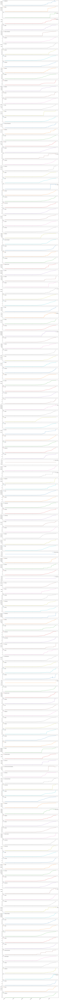

In [118]:
covid_partially_vaccinated_df.T.plot(figsize=(20, 400), subplots=True)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7ff8057e5650>,
      dtype=object)

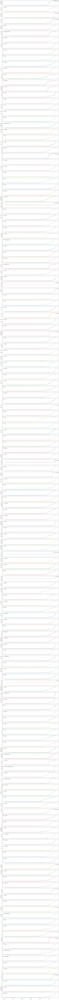

In [119]:
covid_fully_vaccinated_df.T.plot(figsize=(20, 400), subplots=True)

## Smoothing out data.

In [120]:
# Smoothing out data.
covid_partially_vaccinated_df = covid_partially_vaccinated_df.ewm(span=7, adjust=False, axis=1).mean()
covid_fully_vaccinated_df = covid_fully_vaccinated_df.ewm(span=7, adjust=False, axis=1).mean()

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7ff801b5a410>,
      dtype=object)

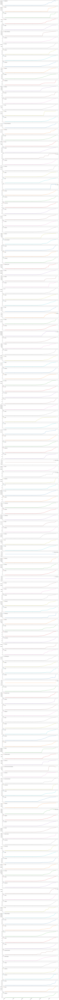

In [121]:
covid_partially_vaccinated_df.T.plot(figsize=(20, 400), subplots=True)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7ff7fde39a90>,
      dtype=object)

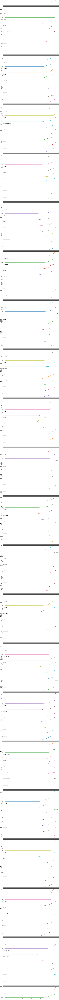

In [122]:
covid_fully_vaccinated_df.T.plot(figsize=(20, 400), subplots=True)

## Normalize vaccination with respect to countries population.

In [123]:
population_data = {'Afghanistan': 37172386, 'Albania': 2866376, 'Algeria': 42228429, 'American Samoa': 55465, 'Andorra': 77006, 'Angola': 30809762, 'Anguilla': 15094, 'Antarctica': 1106, 'Antigua and Barbuda': 96286, 'Argentina': 44494502, 'Armenia': 2951776, 'Aruba': 105845, 'Australia': 24982688, 'Austria': 8840521, 'Azerbaijan': 9939800, 'Bahamas': 385640, 'Bahrain': 1569439, 'Bangladesh': 161356039, 'Barbados': 286641, 'Belarus': 9483499, 'Belgium': 11433256, 'Belize': 383071, 'Benin': 11485048, 'Bermuda': 63973, 'Bhutan': 754394, 'Bolivia': 11353142, 'Bosnia and Herzegovina': 3323929, 'Botswana': 2254126, 'Bouvet Island': 0, 'Brazil': 209469333, 'British Indian Ocean Territory': 0, 'Brunei': 428962, 'Bulgaria': 7025037, 'Burkina Faso': 19751535, 'Burundi': 11175378, 'Cambodia': 16249798, 'Cameroon': 25216237, 'Canada': 37057765, 'Cape Verde': 543767, 'Cayman Islands': 64174, 'Central African Republic': 4666377, 'Chad': 15477751, 'Chile': 18729160, 'China': 1392730000, 'Christmas Island': 1402, 'Cocos (Keeling) Islands': 596, 'Colombia': 49648685, 'Comoros': 832322, 'Congo': 5244363, 'Cook Islands': 17379, 'Costa Rica': 4999441, 'Croatia': 4087843, 'Cuba': 11338138, 'Cyprus': 1189265, 'Czechia': 10629928, 'Denmark': 5793636, 'Djibouti': 958920, 'Dominica': 71625, 'Dominican Republic': 10627165, 'East Timor': 1267972, 'Ecuador': 17084357, 'Egypt': 98423595, 'El Salvador': 6420744, 'England': 55619400, 'Equatorial Guinea': 1308974, 'Eritrea': 6213972, 'Estonia': 1321977, 'Ethiopia': 109224559, 'Falkland Islands': 2840, 'Faroe Islands': 48497, 'Fiji': 883483, 'Finland': 5515525, 'France': 66977107, 'French Guiana': 290691, 'French Polynesia': 277679, 'French Southern territories': 0, 'Gabon': 2119275, 'Gambia': 2280102, 'Georgia': 3726549, 'Germany': 82905782, 'Ghana': 29767108, 'Gibraltar': 33718, 'Greece': 10731726, 'Greenland': 56025, 'Grenada': 111454, 'Guadeloupe': 395700, 'Guam': 165768, 'Guatemala': 17247807, 'Guinea': 12414318, 'Guinea-Bissau': 1874309, 'Guyana': 779004, 'Haiti': 11123176, 'Heard Island and McDonald Islands': 0, 'Holy See (Vatican City State)': 825, 'Honduras': 9587522, 'Hong Kong': 7451000, 'Hungary': 9775564, 'Iceland': 352721, 'India': 1352617328, 'Indonesia': 267663435, 'Iran': 81800269, 'Iraq': 38433600, 'Ireland': 4867309, 'Israel': 8882800, 'Italy': 60421760, "Cote d'Ivoire": 25069229, 'Jamaica': 2934855, 'Japan': 126529100, 'Jordan': 9956011, 'Kazakhstan': 18272430, 'Kenya': 51393010, 'Kiribati': 115847, 'Kosovo': 1935259,  'Kuwait': 4137309, 'Kyrgyzstan': 6322800, 'Laos': 7061507, 'Latvia': 1927174, 'Lebanon': 6848925, 'Lesotho': 2108132, 'Liberia': 4818977, 'Libyan Arab Jamahiriya': 6678567, 'Liechtenstein': 37910, 'Lithuania': 2801543, 'Luxembourg': 607950, 'Macao': 631636, 'Madagascar': 26262368, 'Malawi': 18143315, 'Malaysia': 31528585, 'Maldives': 515696, 'Mali': 19077690, 'Malta': 484630, 'Marshall Islands': 58413, 'Martinique': 376480, 'Mauritania': 4403319, 'Mauritius': 1265303, 'Mayotte': 270372, 'Mexico': 126190788, 'Micronesia': 112640, 'Moldova': 2706049, 'Monaco': 38682, 'Mongolia': 3170208, 'Montenegro': 631219, 'Montserrat': 5900, 'Morocco': 36029138, 'Mozambique': 29495962, 'Burma': 53708395, 'Namibia': 2448255, 'Nauru': 12704, 'Nepal': 28087871, 'Netherlands': 17231624, 'Netherlands Antilles': 227049, 'New Caledonia': 284060, 'New Zealand': 4841000, 'Nicaragua': 6465513, 'Niger': 22442948, 'Nigeria': 195874740, 'Niue': 1624, 'Norfolk Island': 2169, 'North Korea': 25549819, 'North Macedonia': 2084367, 'Northern Ireland': 1885400, 'Northern Mariana Islands': 56882, 'Norway': 5311916, 'Oman': 4829483, 'Pakistan': 212215030, 'Palau': 17907, 'Palestine': 4569087, 'Panama': 4176873, 'Papua New Guinea': 8606316, 'Paraguay': 6956071, 'Peru': 31989256, 'Philippines': 106651922, 'Pitcairn': 67, 'Poland': 37974750, 'Portugal': 10283822, 'Puerto Rico': 3195153, 'Qatar': 2781677, 'Reunion': 859959, 'Romania': 19466145, 'Russia': 144478050, 'Rwanda': 12301939, 'Saint Helena': 6600, 'Saint Kitts and Nevis': 52441, 'Saint Lucia': 181889, 'Saint Pierre and Miquelon': 5888, 'Saint Vincent and the Grenadines': 110210, 'Samoa': 196130, 'San Marino': 33785, 'Sao Tome and Principe': 211028, 'Saudi Arabia': 33699947, 'Scotland': 5424800, 'Senegal': 15854360, 'Serbia': 6963764, 'Seychelles': 96762, 'Sierra Leone': 7650154, 'Singapore': 5638676, 'Slovakia': 5446771, 'Slovenia': 2073894, 'Solomon Islands': 652858, 'Somalia': 15008154, 'South Africa': 57779622, 'South Georgia and the South Sandwich Islands': 30, 'Korea, South': 51606633, 'South Sudan': 10975920, 'Spain': 46796540, 'Sri Lanka': 21670000, 'Sudan': 41801533, 'Suriname': 575991, 'Svalbard and Jan Mayen': 2572, 'Eswatini': 1136191, 'Sweden': 10175214, 'Switzerland': 8513227, 'Syria': 16906283, 'Taiwan*': 23568378, 'Tajikistan': 9100837, 'Tanzania': 56318348, 'Thailand': 69428524, 'The Democratic Republic of Congo': 84068091, 'Togo': 7889094, 'Tokelau': 1411, 'Tonga': 103197, 'Trinidad and Tobago': 1389858, 'Tunisia': 11565204, 'Turkey': 82319724, 'Turkmenistan': 5850908, 'Turks and Caicos Islands': 37665, 'Tuvalu': 11508, 'Uganda': 42723139, 'Ukraine': 44622516, 'United Arab Emirates': 9630959, 'United Kingdom': 66460344, 'US': 326687501, 'United States Minor Outlying Islands': 300, 'Uruguay': 3449299, 'Uzbekistan': 32955400, 'Vanuatu': 292680, 'Venezuela': 28870195, 'Vietnam': 95540395, 'Virgin Islands, British': 29802, 'Virgin Islands, U.S.': 106977, 'Wales': 3139000, 'Wallis and Futuna': 15289, 'Western Sahara': 652271, 'Yemen': 28498687, 'Zambia': 17351822, 'Zimbabwe': 14439018}

In [124]:
countries_in_covid_partially_vaccinated_df = list(covid_partially_vaccinated_df.index)
countries_in_covid_fully_vaccinated_df = list(covid_fully_vaccinated_df.index)


assert(countries_in_covid_partially_vaccinated_df == countries_in_covid_fully_vaccinated_df)

In [125]:
countries_population = []
for country in countries_in_covid_partially_vaccinated_df:
    countries_population.append(population_data[country])

In [126]:
countries_population_df = pd.DataFrame(data={'Countries population': countries_population}, index=countries_in_covid_partially_vaccinated_df)
countries_population_df.index.rename('Country/Region', inplace=True)

In [127]:
countries_population_df

,Countries population
Country/Region,
Afghanistan,37172386
Albania,2866376
Algeria,42228429
Andorra,77006
Angola,30809762
...,...
Uzbekistan,32955400
Venezuela,28870195
Vietnam,95540395


In [128]:
covid_partially_vaccinated_df.iloc[:, -20:]

,7/25/21,7/26/21,7/27/21,7/28/21,7/29/21,7/30/21,7/31/21,8/1/21,8/2/21,8/3/21,8/4/21,8/5/21,8/6/21,8/7/21,8/8/21,8/9/21,8/10/21,8/11/21,8/12/21,8/13/21
Country/Region,,,,,,,,,,,,,,,,,,,,
Afghanistan,8.170100e+05,8.280915e+05,8.364026e+05,8.622607e+05,8.374506e+05,8.188429e+05,8.048872e+05,7.944204e+05,7.865703e+05,7.809117e+05,7.766678e+05,7.734848e+05,7.710976e+05,7.693072e+05,7.679644e+05,7.684406e+05,7.687977e+05,7.691738e+05,7.694558e+05,7.696674e+05
Albania,6.172135e+05,6.229219e+05,6.272031e+05,6.304141e+05,6.328223e+05,6.346285e+05,6.423794e+05,6.493383e+05,6.551950e+05,6.608807e+05,6.664235e+05,6.717597e+05,6.770697e+05,6.810523e+05,6.840392e+05,6.896469e+05,6.938527e+05,7.004475e+05,7.053936e+05,7.091032e+05
Algeria,2.499998e+06,2.499999e+06,2.499999e+06,2.499999e+06,2.730319e+06,2.903059e+06,3.032614e+06,3.129780e+06,3.202655e+06,3.257311e+06,3.298303e+06,3.329047e+06,3.352105e+06,3.369398e+06,3.382369e+06,3.392096e+06,3.399392e+06,3.404864e+06,3.408968e+06,3.412045e+06
Andorra,4.702335e+04,4.737876e+04,4.764532e+04,4.784524e+04,4.799518e+04,4.810763e+04,4.819198e+04,4.825523e+04,4.830267e+04,4.833826e+04,4.836494e+04,4.838496e+04,4.839997e+04,4.841123e+04,4.841967e+04,4.842600e+04,4.843075e+04,4.843431e+04,4.843699e+04,4.843899e+04
Angola,9.581785e+05,9.582271e+05,9.582636e+05,9.582910e+05,9.583115e+05,9.583269e+05,9.583384e+05,9.583470e+05,9.583535e+05,9.612516e+05,9.634252e+05,9.650554e+05,9.662781e+05,9.671951e+05,9.678828e+05,9.691566e+05,9.701119e+05,9.708285e+05,9.713658e+05,9.717689e+05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Uzbekistan,3.384150e+06,3.455107e+06,3.508325e+06,3.548238e+06,3.578174e+06,3.600625e+06,3.617463e+06,3.630092e+06,3.639564e+06,3.646668e+06,4.042864e+06,4.340010e+06,4.562871e+06,4.730016e+06,5.308262e+06,5.741946e+06,6.067210e+06,6.311157e+06,6.494118e+06,6.631338e+06
Venezuela,2.880848e+06,2.885636e+06,2.889227e+06,2.891920e+06,2.893940e+06,2.895455e+06,2.896591e+06,2.897444e+06,2.898083e+06,2.898562e+06,2.898922e+06,2.899191e+06,2.899393e+06,2.899545e+06,2.899659e+06,2.899744e+06,2.899808e+06,2.899856e+06,2.899892e+06,2.899919e+06
Vietnam,4.087238e+06,4.121335e+06,4.171894e+06,4.269506e+06,4.448003e+06,4.581876e+06,4.832221e+06,5.063205e+06,5.358987e+06,5.656109e+06,5.935665e+06,6.262022e+06,6.506790e+06,6.882131e+06,7.276602e+06,7.703526e+06,8.023720e+06,8.769320e+06,9.328520e+06,1.001254e+07


In [129]:
covid_partially_vaccinated_df = covid_partially_vaccinated_df.divide(countries_population, axis=0)
covid_fully_vaccinated_df = covid_fully_vaccinated_df.divide(countries_population, axis=0)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7ff7f9e0cbd0>],
      dtype=object)

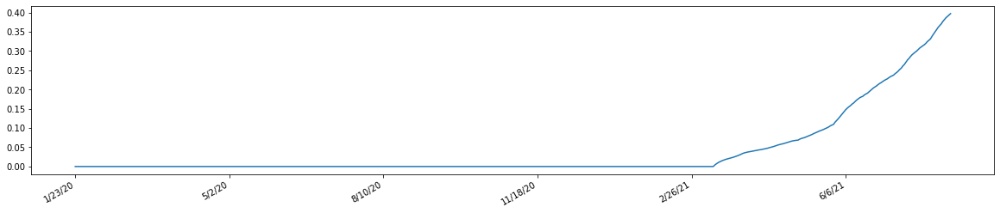

In [130]:
covid_partially_vaccinated_df.loc['Colombia'].T.plot(figsize=(20, 4), subplots=True)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7ff7f9c4f950>],
      dtype=object)

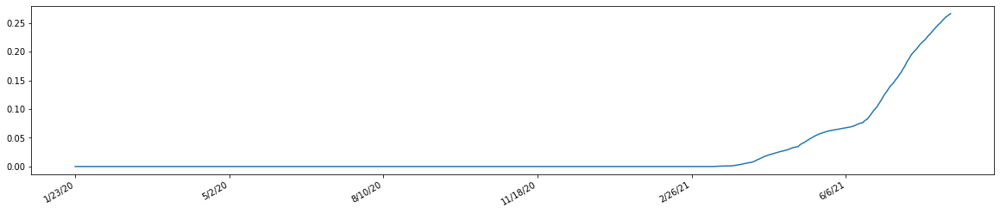

In [131]:
covid_fully_vaccinated_df.loc['Colombia'].T.plot(figsize=(20, 4), subplots=True)

## Save vaccination data

In [132]:
# Saving these processed data to CSV.
covid_partially_vaccinated_df.to_csv(r'/content/gdrive/MyDrive/Covid_Project/Data/Processed_Data/partially_vaccinated_processed.csv')
covid_fully_vaccinated_df.to_csv(r'/content/gdrive/MyDrive/Covid_Project/Data/Processed_Data/fully_vaccinated_processed.csv')